# **Feature Engineering Notebook**

## Objectives

*   Engineer features for Classification, Regression and Cluster models


## Inputs

* inputs/datasets/cleaned/TrainSet.csv
* inputs/datasets/cleaned/TestSet.csv

## Outputs

* generate a list with variables to engineer

## Conclusions

* Feature Engineering Transformers
  * Ordinal categorical encoding: `[']`
  * Smart Correlation Selection: `[']`


---

# Change working directory

We need to change the working directory from its current folder to its parent folder
* We access the current directory with os.getcwd()

In [1]:
import os
current_dir = os.getcwd()
current_dir

'/workspace/heritage-housing-predictive-analytics/jupyter_notebooks'

We want to make the parent of the current directory the new current directory
* os.path.dirname() gets the parent directory
* os.chir() defines the new current directory

In [2]:
os.chdir(os.path.dirname(current_dir))
print("You set a new current directory")

You set a new current directory


Confirm the new current directory

In [3]:
current_dir = os.getcwd()
current_dir

'/workspace/heritage-housing-predictive-analytics'

# Load Cleaned Data

Train Set

In [4]:
import pandas as pd
train_set_path = "outputs/datasets/cleaned/TrainSetCleaned.csv"
TrainSet = pd.read_csv(train_set_path)
TrainSet.head(3)

,1stFlrSF,2ndFlrSF,BedroomAbvGr,BsmtExposure,BsmtFinSF1,BsmtFinType1,BsmtUnfSF,GarageArea,GarageFinish,GarageYrBlt,...,LotArea,LotFrontage,MasVnrArea,OpenPorchSF,OverallCond,OverallQual,TotalBsmtSF,YearBuilt,YearRemodAdd,SalePrice
0,1828,0.0,3.0,Av,48,Missing,1774,774,Unf,2007.0,...,11694,90.0,452.0,108,5,9,1822,2007,2007,314813
1,894,0.0,2.0,No,0,Unf,894,308,Missing,1962.0,...,6600,60.0,0.0,0,5,5,894,1962,1962,109500
2,964,0.0,2.0,No,713,ALQ,163,432,Unf,1921.0,...,13360,80.0,0.0,0,7,5,876,1921,2006,163500


Test Set

In [5]:
test_set_path = 'outputs/datasets/cleaned/TestSetCleaned.csv'
TestSet = pd.read_csv(test_set_path)
TestSet.head(3)

,1stFlrSF,2ndFlrSF,BedroomAbvGr,BsmtExposure,BsmtFinSF1,BsmtFinType1,BsmtUnfSF,GarageArea,GarageFinish,GarageYrBlt,...,LotArea,LotFrontage,MasVnrArea,OpenPorchSF,OverallCond,OverallQual,TotalBsmtSF,YearBuilt,YearRemodAdd,SalePrice
0,2515,0.0,4.0,No,1219,Rec,816,484,Missing,1975.0,...,32668,69.0,0.0,0,3,6,2035,1957,1975,200624
1,958,620.0,3.0,No,403,BLQ,238,240,Unf,1941.0,...,9490,79.0,0.0,0,7,6,806,1941,1950,133000
2,979,224.0,3.0,No,185,LwQ,524,352,Unf,1950.0,...,7015,69.0,161.0,0,4,5,709,1950,1950,110000


# Data Exploration

In [6]:
from ydata_profiling import ProfileReport
pandas_report = ProfileReport(df=TrainSet, minimal=True)
pandas_report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Correlation and PPS Analysis

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import ppscore as pps


def heatmap_corr(TrainSet, threshold, figsize=(20, 12), font_annot=8):
    if len(TrainSet.columns) > 1:
        mask = np.zeros_like(TrainSet, dtype=np.bool)
        mask[np.triu_indices_from(mask)] = True
        mask[abs(TrainSet) < threshold] = True

        fig, axes = plt.subplots(figsize=figsize)
        sns.heatmap(TrainSet, annot=True, xticklabels=True, yticklabels=True,
                    mask=mask, cmap='viridis', annot_kws={"size": font_annot}, ax=axes,
                    linewidth=0.5
                    )
        axes.set_yticklabels(TrainSet.columns, rotation=0)
        plt.ylim(len(TrainSet.columns), 0)
        plt.show()


def heatmap_pps(TrainSet, threshold, figsize=(20, 12), font_annot=8):
    if len(TrainSet.columns) > 1:
        mask = np.zeros_like(TrainSet, dtype=np.bool)
        mask[abs(TrainSet) < threshold] = True
        fig, ax = plt.subplots(figsize=figsize)
        ax = sns.heatmap(TrainSet, annot=True, xticklabels=True, yticklabels=True,
                         mask=mask, cmap='rocket_r', annot_kws={"size": font_annot},
                         linewidth=0.05, linecolor='grey')
        plt.ylim(len(TrainSet.columns), 0)
        plt.show()


def CalculateCorrAndPPS(TrainSet):
    df_corr_spearman = TrainSet.corr(method="spearman")
    df_corr_pearson = TrainSet.corr(method="pearson")

    pps_matrix_raw = pps.matrix(TrainSet)
    pps_matrix = pps_matrix_raw.filter(['x', 'y', 'ppscore']).pivot(columns='x', index='y', values='ppscore')

    pps_score_stats = pps_matrix_raw.query("ppscore < 1").filter(['ppscore']).describe().T
    print("PPS threshold - check PPS score IQR to decide threshold for heatmap \n")
    print(pps_score_stats.round(3))

    return df_corr_pearson, df_corr_spearman, pps_matrix


def DisplayCorrAndPPS(df_corr_pearson, df_corr_spearman, pps_matrix, CorrThreshold, PPS_Threshold,
                      figsize=(20, 12), font_annot=8):

    print("\n")
    print("* Analyse how the target variable for your ML models are correlated with other variables (features and target)")
    print("* Analyse multi-colinearity, that is, how the features are correlated among themselves")

    print("\n")
    print("*** Heatmap: Spearman Correlation ***")
    print("It evaluates monotonic relationship \n")
    heatmap_corr(TrainSet=df_corr_spearman, threshold=CorrThreshold, figsize=figsize, font_annot=font_annot)

    print("\n")
    print("*** Heatmap: Pearson Correlation ***")
    print("It evaluates the linear relationship between two continuous variables \n")
    heatmap_corr(TrainSet=df_corr_pearson, threshold=CorrThreshold, figsize=figsize, font_annot=font_annot)

    print("\n")
    print("*** Heatmap: Power Predictive Score (PPS) ***")
    print(f"PPS detects linear or non-linear relationships between two columns.\n"
          f"The score ranges from 0 (no predictive power) to 1 (perfect predictive power) \n")
    heatmap_pps(TrainSet=pps_matrix, threshold=PPS_Threshold, figsize=figsize, font_annot=font_annot)

In [8]:
df_corr_pearson, df_corr_spearman, pps_matrix = CalculateCorrAndPPS(TrainSet)

PPS threshold - check PPS score IQR to decide threshold for heatmap 

         count   mean    std  min  25%  50%    75%    max
ppscore  462.0  0.059  0.106  0.0  0.0  0.0  0.075  0.618




* Analyse how the target variable for your ML models are correlated with other variables (features and target)
* Analyse multi-colinearity, that is, how the features are correlated among themselves


*** Heatmap: Spearman Correlation ***
It evaluates monotonic relationship 



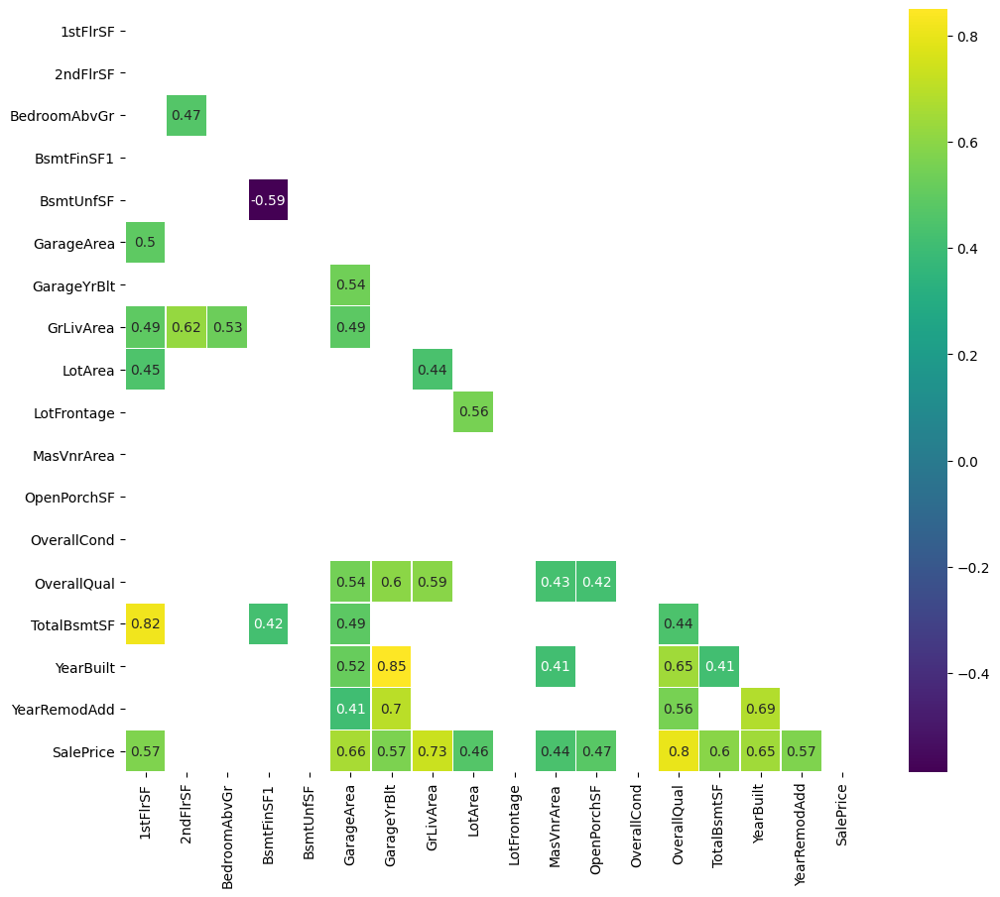



*** Heatmap: Pearson Correlation ***
It evaluates the linear relationship between two continuous variables 



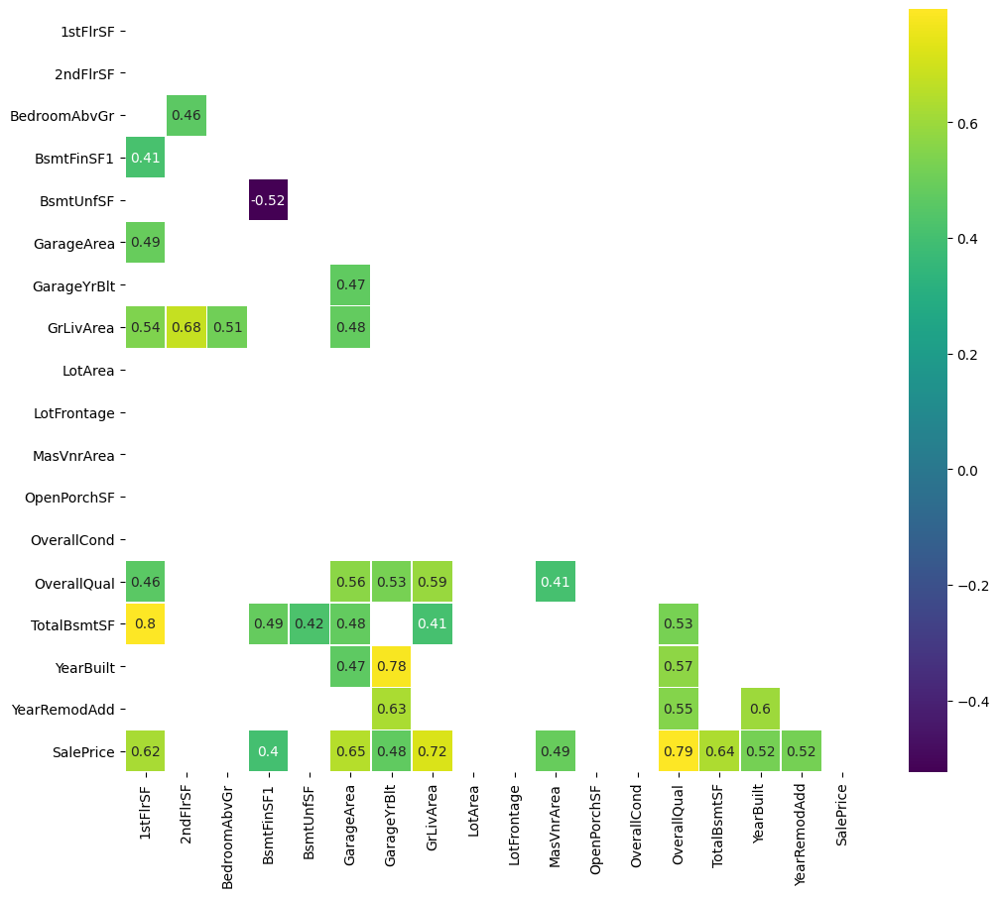



*** Heatmap: Power Predictive Score (PPS) ***
PPS detects linear or non-linear relationships between two columns.
The score ranges from 0 (no predictive power) to 1 (perfect predictive power) 



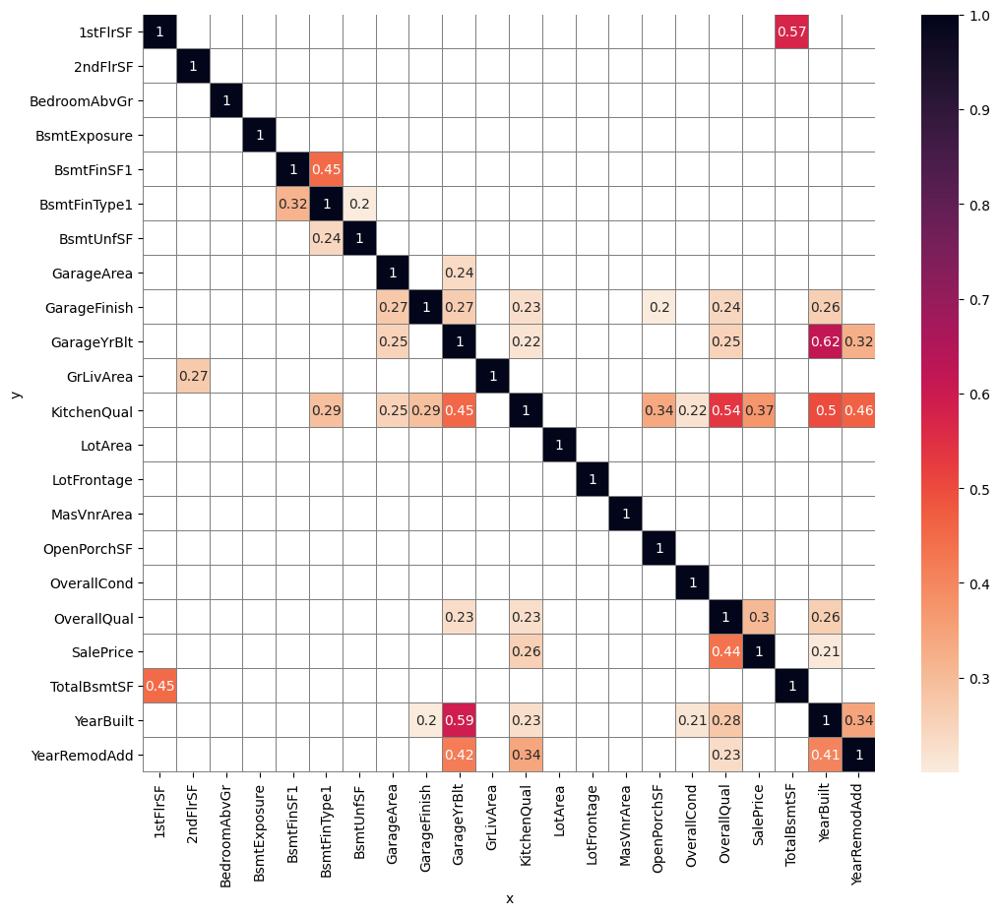

In [9]:
DisplayCorrAndPPS(df_corr_pearson = df_corr_pearson,
                  df_corr_spearman = df_corr_spearman, 
                  pps_matrix = pps_matrix,
                  CorrThreshold = 0.4, PPS_Threshold =0.2,
                  figsize=(12,10), font_annot=10)

# Feature Engineering

## Custom function

In [10]:
import numpy as np
from sklearn.pipeline import Pipeline
from feature_engine import transformation as vt
from feature_engine.outliers import Winsorizer
from feature_engine.encoding import OrdinalEncoder
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
sns.set(style="whitegrid")
import warnings
warnings.filterwarnings('ignore')

mappings = {
    'BsmtExposure': {'None': 0, 'No': 1, 'Mn': 2, 'Av': 3, 'Gd': 4},
    'BsmtFinType1': {'Missing': -1, 'None': 0, 'Unf': 1, 'LwQ': 2, 'Rec': 3, 'BLQ': 4, 'ALQ': 5, 'GLQ': 6},
    'GarageFinish': {'Missing': -1, 'None': 0, 'Unf': 1, 'RFn': 2, 'Fin': 3},
    'KitchenQual': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5}
}

def FeatureEngineeringAnalysis(df,analysis_type=None):

  """
  - used for quick feature engineering on numerical and categorical variables
  to decide which transformation can better transform the distribution shape 
  - Once transformed, use a reporting tool, like pandas-profiling, to evaluate distributions

  """
  check_missing_values(df)
  allowed_types= ['numerical', 'ordinal_encoder',  'outlier_winsorizer']
  check_user_entry_on_analysis_type(analysis_type, allowed_types)
  list_column_transformers = define_list_column_transformers(analysis_type)
  
  
  # Loop over each variable and engineer the data according to the analysis type
  df_feat_eng = pd.DataFrame([])
  for column in df.columns:
    # create additional columns (column_method) to apply the methods
    df_feat_eng = pd.concat([df_feat_eng, df[column]], axis=1)
    for method in list_column_transformers:
      df_feat_eng[f"{column}_{method}"] = df[column]
      
    # Apply transformers in respectives column_transformers
    df_feat_eng, list_applied_transformers = apply_transformers(analysis_type, df_feat_eng, column)

    # For each variable, assess how the transformations perform
    transformer_evaluation(column, list_applied_transformers, analysis_type, df_feat_eng)

  return df_feat_eng


def check_user_entry_on_analysis_type(analysis_type, allowed_types):
  ### Check analyis type
  if analysis_type == None:
    raise SystemExit(f"You should pass analysis_type parameter as one of the following options: {allowed_types}")
  if analysis_type not in allowed_types:
      raise SystemExit(f"analysis_type argument should be one of these options: {allowed_types}")

def check_missing_values(df):
  if df.isna().sum().sum() != 0:
    raise SystemExit(
        f"There is missing values in your dataset. Please handle that before getting into feature engineering.")



def define_list_column_transformers(analysis_type):
  ### Set suffix colummns acording to analysis_type
  if analysis_type=='numerical':
    list_column_transformers = ["log_e","log_10","reciprocal", "power","box_cox","yeo_johnson"]
  
  elif analysis_type=='ordinal_encoder':
    list_column_transformers = ["ordinal_encoder"]

  elif analysis_type=='outlier_winsorizer':
    list_column_transformers = ['iqr']

  return list_column_transformers



def apply_transformers(analysis_type, df_feat_eng, column):


  for col in df_feat_eng.select_dtypes(include='category').columns:
    df_feat_eng[col] = df_feat_eng[col].astype('object')


  if analysis_type=='numerical':
    df_feat_eng,list_applied_transformers = FeatEngineering_Numerical(df_feat_eng,column)
  
  elif analysis_type=='outlier_winsorizer':
    df_feat_eng,list_applied_transformers = FeatEngineering_OutlierWinsorizer(df_feat_eng,column)

  elif analysis_type=='ordinal_encoder':
    df_feat_eng,list_applied_transformers = FeatEngineering_CategoricalEncoder(df_feat_eng,column)

  return df_feat_eng,list_applied_transformers



def transformer_evaluation(column, list_applied_transformers, analysis_type, df_feat_eng):
  # For each variable, assess how the transformations perform
  print(f"* Variable Analyzed: {column}")
  print(f"* Applied transformation: {list_applied_transformers} \n")
  for col in [column] + list_applied_transformers:
    
    if analysis_type!='ordinal_encoder':
      DiagnosticPlots_Numerical(df_feat_eng, col)
    
    else:
      if col == column: 
        DiagnosticPlots_Categories(df_feat_eng, col)
      else:
        DiagnosticPlots_Numerical(df_feat_eng, col)

    print("\n")



def DiagnosticPlots_Categories(df_feat_eng, col):
  plt.figure(figsize=(20, 5))
  sns.countplot(data=df_feat_eng, x=col,palette=['#432371'],order = df_feat_eng[col].value_counts().index)
  plt.xticks(rotation=90) 
  plt.suptitle(f"{col}", fontsize=30,y=1.05)        
  plt.show();
  print("\n")



def DiagnosticPlots_Numerical(df, variable):
  fig, axes = plt.subplots(1, 3, figsize=(20, 6))
  sns.histplot(data=df, x=variable, kde=True,element="step",ax=axes[0]) 
  stats.probplot(df[variable], dist="norm", plot=axes[1])
  sns.boxplot(x=df[variable],ax=axes[2])
  
  axes[0].set_title('Histogram')
  axes[1].set_title('QQ Plot')
  axes[2].set_title('Boxplot')
  fig.suptitle(f"{variable}", fontsize=30,y=1.05)
  plt.show();


def FeatEngineering_CategoricalEncoder(df_feat_eng, column):
    list_methods_worked = []

    # Check if a custom mapping exists for the column
    if column in mappings:
        # Apply the custom mapping directly
        try:
            df_feat_eng[f"{column}_custom_encoder"] = df_feat_eng[column].map(mappings[column])
            list_methods_worked.append(f"{column}_custom_encoder")
        except Exception as e:
            print(f"Mapping failed for {column} due to: {e}")
            df_feat_eng.drop([f"{column}_ordinal_encoder"], axis=1, inplace=True)
    else:
        # Use OrdinalEncoder for columns without a custom mapping
        try:
            encoder = OrdinalEncoder(encoding_method='arbitrary', variables=[f"{column}_ordinal_encoder"])
            df_feat_eng = encoder.fit_transform(df_feat_eng)
            list_methods_worked.append(f"{column}_ordinal_encoder")
        except:
            df_feat_eng.drop([f"{column}_ordinal_encoder"], axis=1, inplace=True)
    
    return df_feat_eng, list_methods_worked


def FeatEngineering_OutlierWinsorizer(df_feat_eng,column):
  list_methods_worked = []

  ### Winsorizer iqr
  try: 
    disc=Winsorizer(
        capping_method='iqr', tail='both', fold=1.5, variables = [f"{column}_iqr"])
    df_feat_eng = disc.fit_transform(df_feat_eng)
    list_methods_worked.append(f"{column}_iqr")
  except: 
    df_feat_eng.drop([f"{column}_iqr"],axis=1,inplace=True)


  return df_feat_eng,list_methods_worked




def FeatEngineering_Numerical(df_feat_eng,column):

  list_methods_worked = []

  ### LogTransformer base e
  try: 
    lt = vt.LogTransformer(variables = [f"{column}_log_e"])
    df_feat_eng = lt.fit_transform(df_feat_eng)
    list_methods_worked.append(f"{column}_log_e")
  except: 
    df_feat_eng.drop([f"{column}_log_e"],axis=1,inplace=True)

    ### LogTransformer base 10
  try: 
    lt = vt.LogTransformer(variables = [f"{column}_log_10"],base='10')
    df_feat_eng = lt.fit_transform(df_feat_eng)
    list_methods_worked.append(f"{column}_log_10")
  except: 
    df_feat_eng.drop([f"{column}_log_10"],axis=1,inplace=True)

  ### ReciprocalTransformer
  try:
    rt = vt.ReciprocalTransformer(variables = [f"{column}_reciprocal"])
    df_feat_eng =  rt.fit_transform(df_feat_eng)
    list_methods_worked.append(f"{column}_reciprocal")
  except:
    df_feat_eng.drop([f"{column}_reciprocal"],axis=1,inplace=True)

  ### PowerTransformer
  try:
    pt = vt.PowerTransformer(variables = [f"{column}_power"])
    df_feat_eng = pt.fit_transform(df_feat_eng)
    list_methods_worked.append(f"{column}_power")
  except:
    df_feat_eng.drop([f"{column}_power"],axis=1,inplace=True)

  ### BoxCoxTransformer
  try:
    bct = vt.BoxCoxTransformer(variables = [f"{column}_box_cox"])
    df_feat_eng = bct.fit_transform(df_feat_eng)
    list_methods_worked.append(f"{column}_box_cox")
  except:
    df_feat_eng.drop([f"{column}_box_cox"],axis=1,inplace=True)


  ### YeoJohnsonTransformer
  try:
    yjt = vt.YeoJohnsonTransformer(variables = [f"{column}_yeo_johnson"])
    df_feat_eng = yjt.fit_transform(df_feat_eng)
    list_methods_worked.append(f"{column}_yeo_johnson")
  except:
        df_feat_eng.drop([f"{column}_yeo_johnson"],axis=1,inplace=True)


  return df_feat_eng,list_methods_worked

## Feature Engineering Spreadsheet Summary

* Transformers to use:
    * Categorical Encoding
    * Numerical Transformation
    * Smart Correlation Selection

## Dealing with Feature Engineering

### Ordinal Encoding

BsmtExposure, BsmtFinType1, GarageFinish and KitchenQual will require custom ordinal encoding as their values represent a certain quality which needs to be in a specific order to add meaningful value. 

In [11]:
variables_engineering= ['BsmtExposure', 'BsmtFinType1', 'GarageFinish', 'KitchenQual']
variables_engineering

['BsmtExposure', 'BsmtFinType1', 'GarageFinish', 'KitchenQual']

In [12]:
df_engineering = TrainSet[variables_engineering].copy()
df_engineering.head(3)

,BsmtExposure,BsmtFinType1,GarageFinish,KitchenQual
0,Av,Missing,Unf,Gd
1,No,Unf,Missing,TA
2,No,ALQ,Unf,TA


* Variable Analyzed: BsmtExposure
* Applied transformation: ['BsmtExposure_custom_encoder'] 



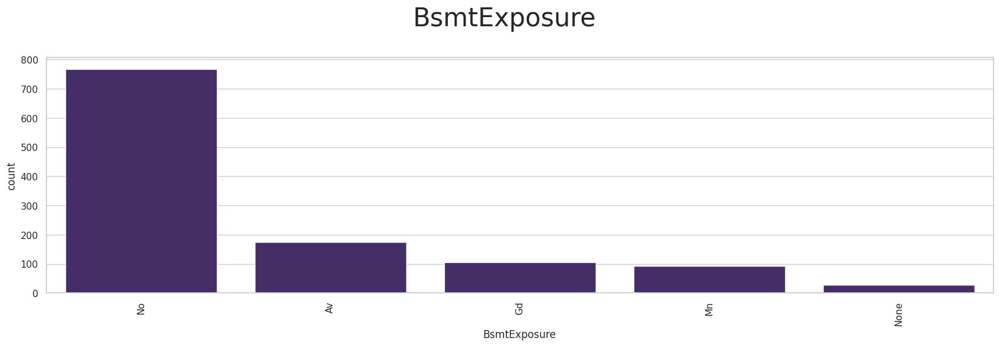

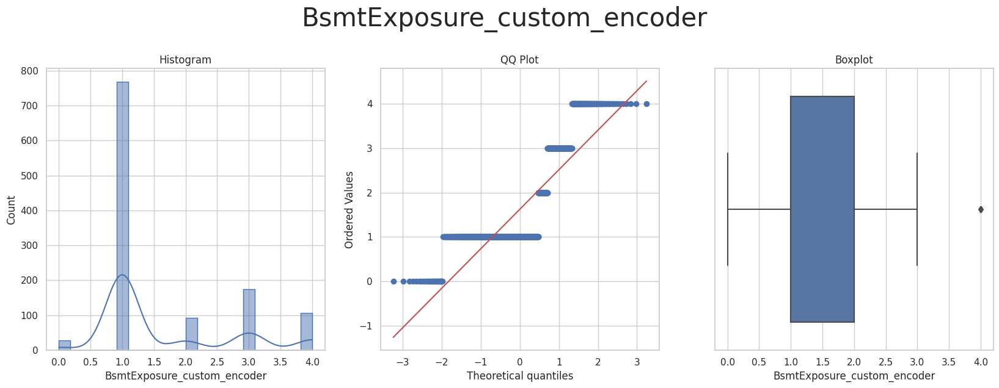



* Variable Analyzed: BsmtFinType1
* Applied transformation: ['BsmtFinType1_custom_encoder'] 



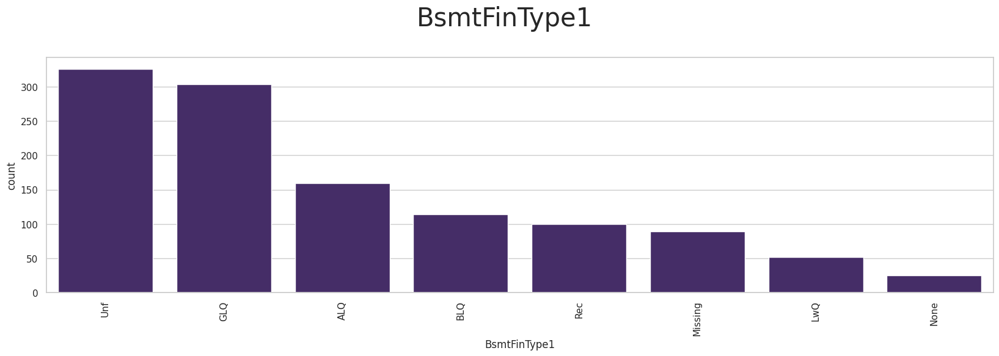

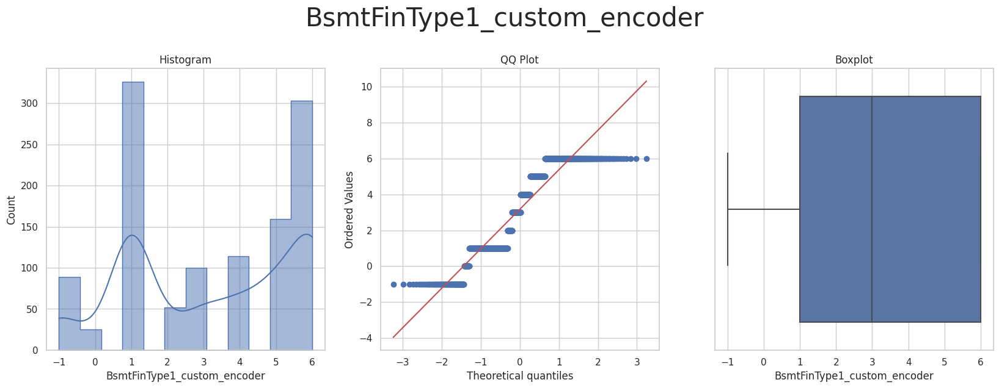



* Variable Analyzed: GarageFinish
* Applied transformation: ['GarageFinish_custom_encoder'] 



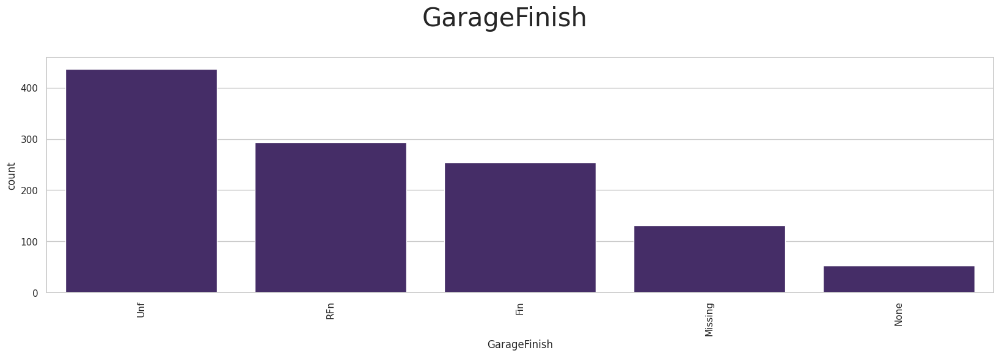

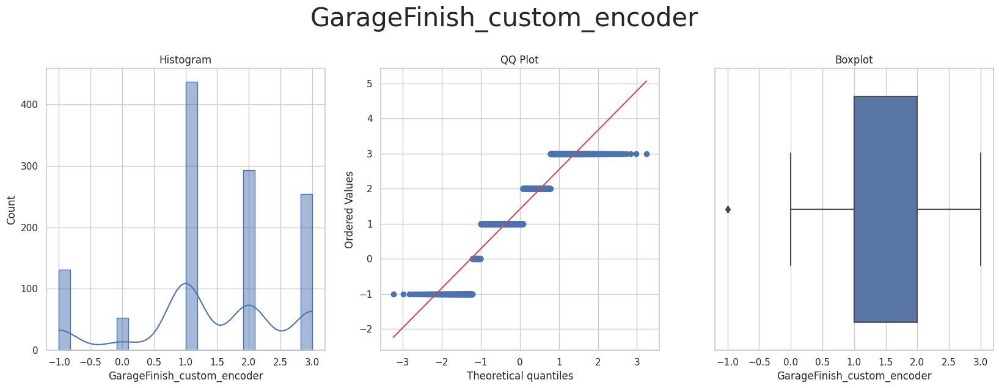



* Variable Analyzed: KitchenQual
* Applied transformation: ['KitchenQual_custom_encoder'] 



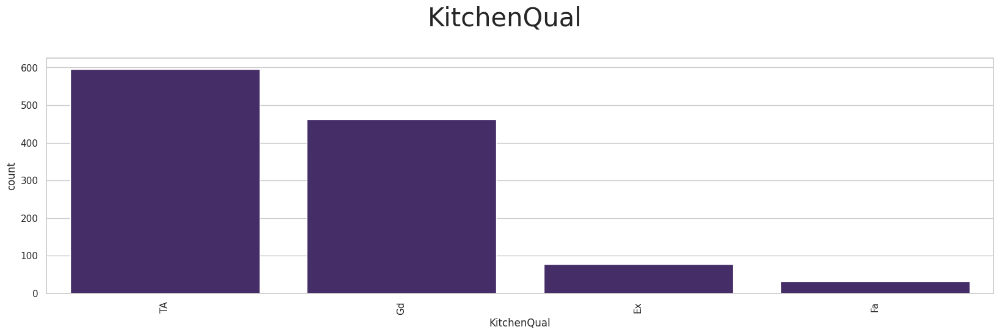

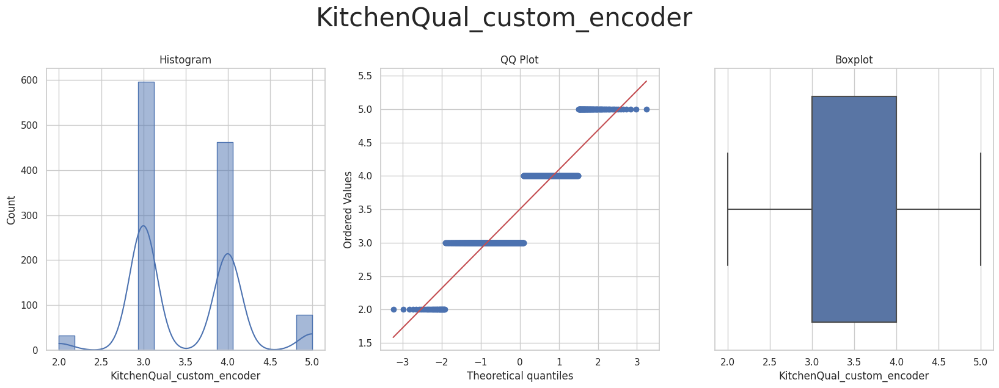

In [13]:
df_engineering = FeatureEngineeringAnalysis(df=df_engineering, analysis_type='ordinal_encoder')

In [14]:
df_engineering.head(3)

,BsmtExposure,BsmtExposure_ordinal_encoder,BsmtExposure_custom_encoder,BsmtFinType1,BsmtFinType1_ordinal_encoder,BsmtFinType1_custom_encoder,GarageFinish,GarageFinish_ordinal_encoder,GarageFinish_custom_encoder,KitchenQual,KitchenQual_ordinal_encoder,KitchenQual_custom_encoder
0,Av,Av,3,Missing,Missing,-1,Unf,Unf,1,Gd,Gd,4
1,No,No,1,Unf,Unf,1,Missing,Missing,-1,TA,TA,3
2,No,No,1,ALQ,ALQ,5,Unf,Unf,1,TA,TA,3


For all variables, the transformation is effective, since it converted categories to numbers, specifically mapping the category order.

Apply to Train and Test sets

In [15]:
mappings = {
    'BsmtExposure': {'None': 0, 'No': 1, 'Mn': 2, 'Av': 3, 'Gd': 4},
    'BsmtFinType1': {'Missing': -1, 'None': 0, 'Unf': 1, 'LwQ': 2, 'Rec': 3, 'BLQ': 4, 'ALQ': 5, 'GLQ': 6},
    'GarageFinish': {'Missing': -1, 'None': 0, 'Unf': 1, 'RFn': 2, 'Fin': 3},
    'KitchenQual': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5}
}

# Apply the custom mappings
for column, mapping in mappings.items():
    TrainSet[column] = TrainSet[column].map(mapping)
    TestSet[column] = TestSet[column].map(mapping)

print("* Custom ordinal encoding applied with 'missing' category handled.")

* Custom ordinal encoding applied with 'missing' category handled.


Check the unique values to ensure that the enoding has worked correctly

In [16]:
# List of columns to check
columns_to_check = ['BsmtExposure', 'BsmtFinType1', 'GarageFinish', 'KitchenQual']

# Display unique values for each column in TrainSet
for column in columns_to_check:
    unique_values = TrainSet[column].unique()
    print(f"Unique values in '{column}' (TrainSet): {unique_values}")
TrainSet.head(5)
    
# Display unique values for each column in TestSet
for column in columns_to_check:
    unique_values = TestSet[column].unique()
    print(f"Unique values in '{column}' (TestSet): {unique_values}")
TestSet.head(5)

Unique values in 'BsmtExposure' (TrainSet): [3 1 4 0 2]
Unique values in 'BsmtFinType1' (TrainSet): [-1  1  5  6  3  0  2  4]
Unique values in 'GarageFinish' (TrainSet): [ 1 -1  2  3  0]
Unique values in 'KitchenQual' (TrainSet): [4 3 5 2]
Unique values in 'BsmtExposure' (TestSet): [1 4 3 2 0]
Unique values in 'BsmtFinType1' (TestSet): [ 3  4  2  1 -1  6  5  0]
Unique values in 'GarageFinish' (TestSet): [-1  1  3  2  0]
Unique values in 'KitchenQual' (TestSet): [3 2 4 5]


,1stFlrSF,2ndFlrSF,BedroomAbvGr,BsmtExposure,BsmtFinSF1,BsmtFinType1,BsmtUnfSF,GarageArea,GarageFinish,GarageYrBlt,...,LotArea,LotFrontage,MasVnrArea,OpenPorchSF,OverallCond,OverallQual,TotalBsmtSF,YearBuilt,YearRemodAdd,SalePrice
0,2515,0.0,4.0,1,1219,3,816,484,-1,1975.0,...,32668,69.0,0.0,0,3,6,2035,1957,1975,200624
1,958,620.0,3.0,1,403,4,238,240,1,1941.0,...,9490,79.0,0.0,0,7,6,806,1941,1950,133000
2,979,224.0,3.0,1,185,2,524,352,1,1950.0,...,7015,69.0,161.0,0,4,5,709,1950,1950,110000
3,1156,866.0,4.0,1,392,4,768,505,3,1977.0,...,10005,83.0,299.0,117,5,7,1160,1977,1977,192000
4,525,0.0,3.0,1,0,1,525,264,1,1971.0,...,1680,21.0,381.0,0,5,6,525,1971,1971,88000


### Numerical Encoding

The FeatureEngineeringAnalysis function is used to generate plots for the numerical variables, illustrating the impact of various transformations on the data's distribution.

In [17]:
variables_engineering = ['1stFlrSF', '2ndFlrSF', 'BedroomAbvGr', 'BsmtFinSF1', 'BsmtUnfSF', 'GarageArea', 'GarageYrBlt', 'GrLivArea', 'LotArea', 'LotFrontage', 'MasVnrArea', 'OpenPorchSF', 'OverallCond', 'OverallQual', 'TotalBsmtSF', 'YearBuilt', 'YearRemodAdd']
variables_engineering

['1stFlrSF',
 '2ndFlrSF',
 'BedroomAbvGr',
 'BsmtFinSF1',
 'BsmtUnfSF',
 'GarageArea',
 'GarageYrBlt',
 'GrLivArea',
 'LotArea',
 'LotFrontage',
 'MasVnrArea',
 'OpenPorchSF',
 'OverallCond',
 'OverallQual',
 'TotalBsmtSF',
 'YearBuilt',
 'YearRemodAdd']

In [18]:
df_engineering = TrainSet[variables_engineering].copy()
df_engineering.head(3)

,1stFlrSF,2ndFlrSF,BedroomAbvGr,BsmtFinSF1,BsmtUnfSF,GarageArea,GarageYrBlt,GrLivArea,LotArea,LotFrontage,MasVnrArea,OpenPorchSF,OverallCond,OverallQual,TotalBsmtSF,YearBuilt,YearRemodAdd
0,1828,0.0,3.0,48,1774,774,2007.0,1828,11694,90.0,452.0,108,5,9,1822,2007,2007
1,894,0.0,2.0,0,894,308,1962.0,894,6600,60.0,0.0,0,5,5,894,1962,1962
2,964,0.0,2.0,713,163,432,1921.0,964,13360,80.0,0.0,0,7,5,876,1921,2006


* Variable Analyzed: 1stFlrSF
* Applied transformation: ['1stFlrSF_log_e', '1stFlrSF_log_10', '1stFlrSF_reciprocal', '1stFlrSF_power', '1stFlrSF_box_cox', '1stFlrSF_yeo_johnson'] 



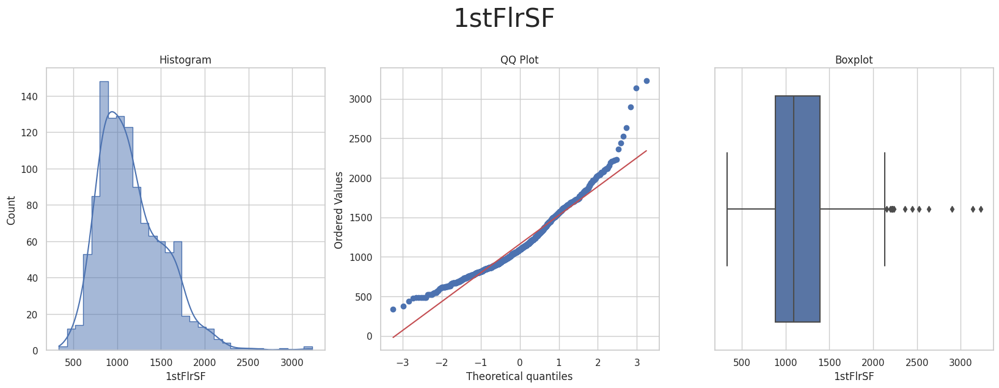

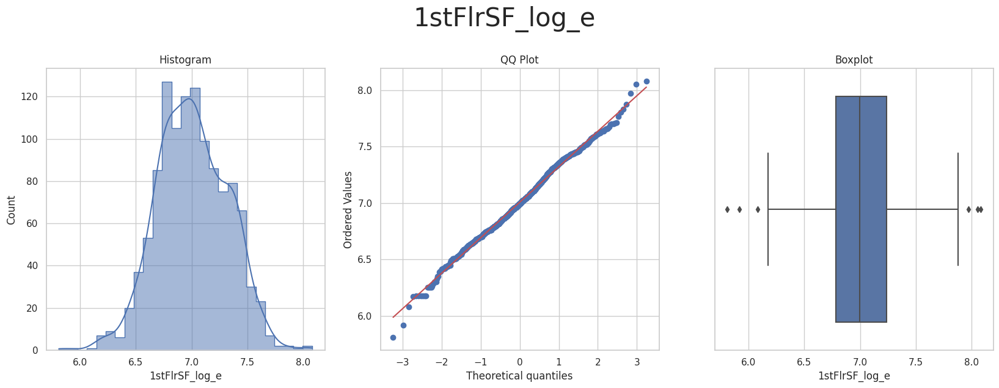

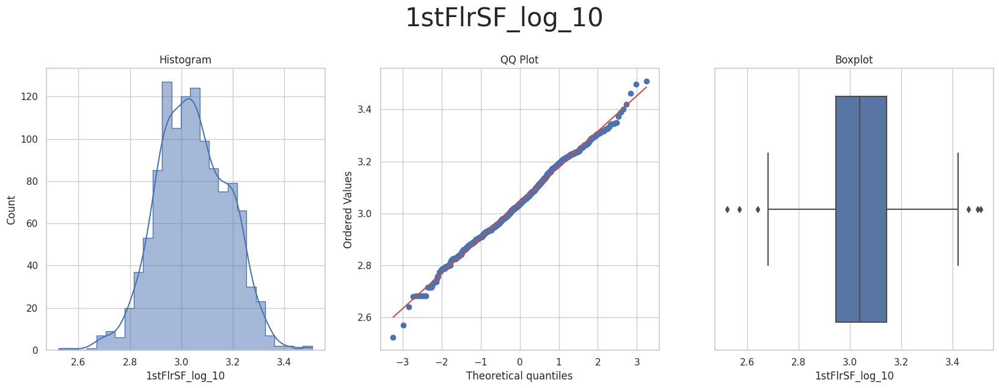

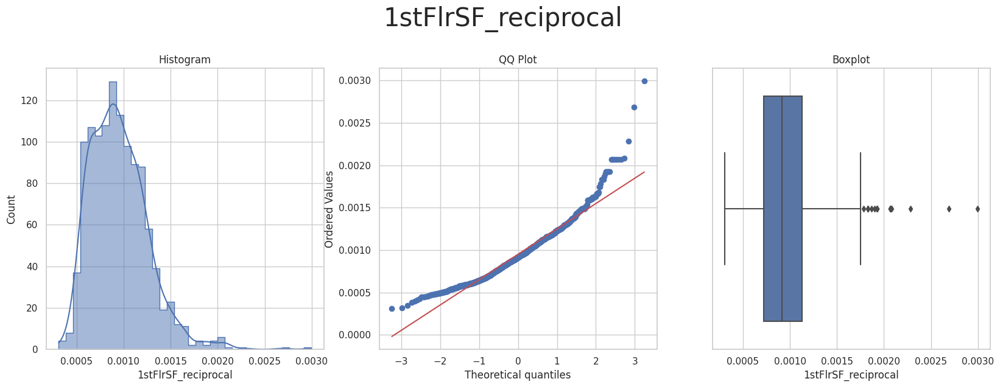

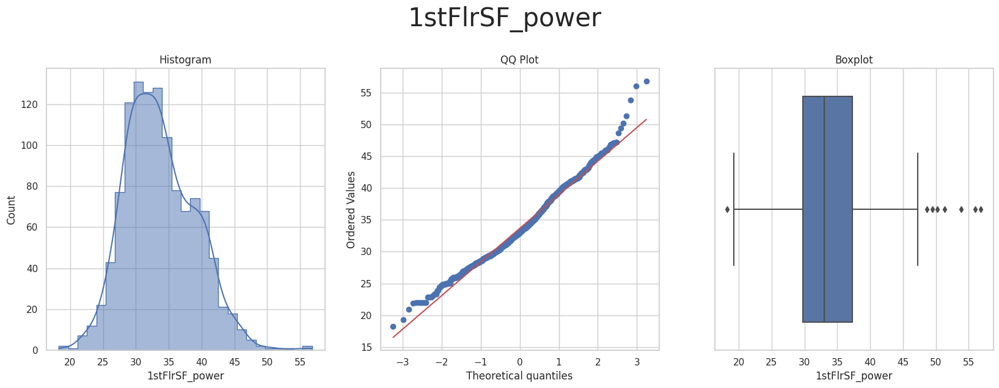

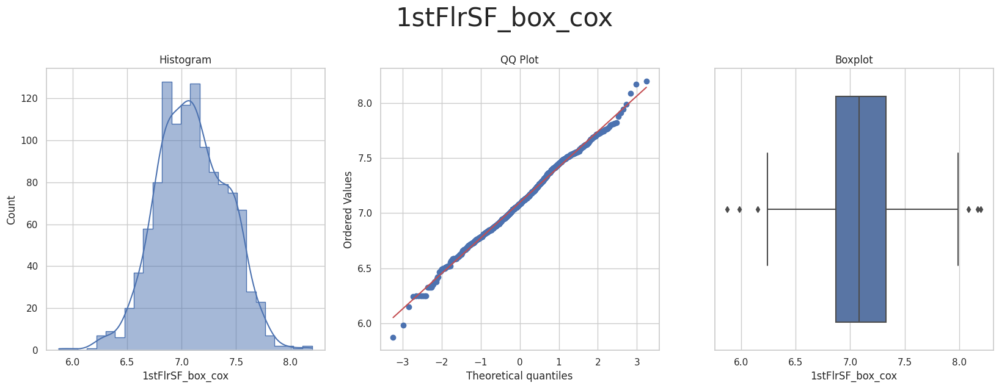

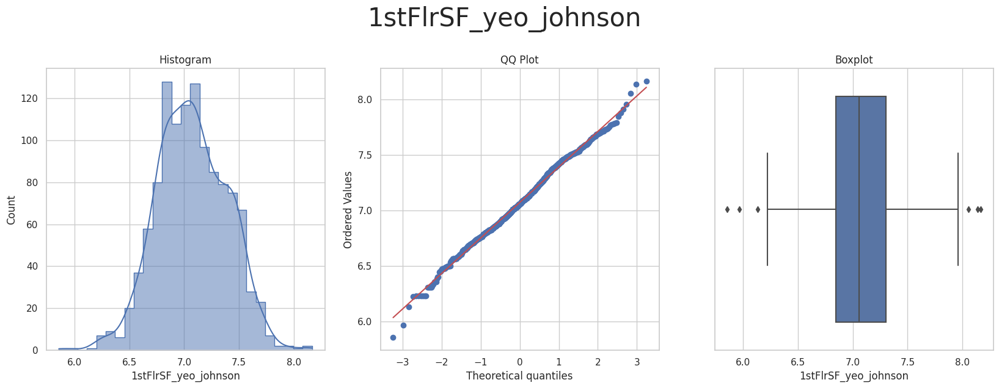



* Variable Analyzed: 2ndFlrSF
* Applied transformation: ['2ndFlrSF_power', '2ndFlrSF_yeo_johnson'] 



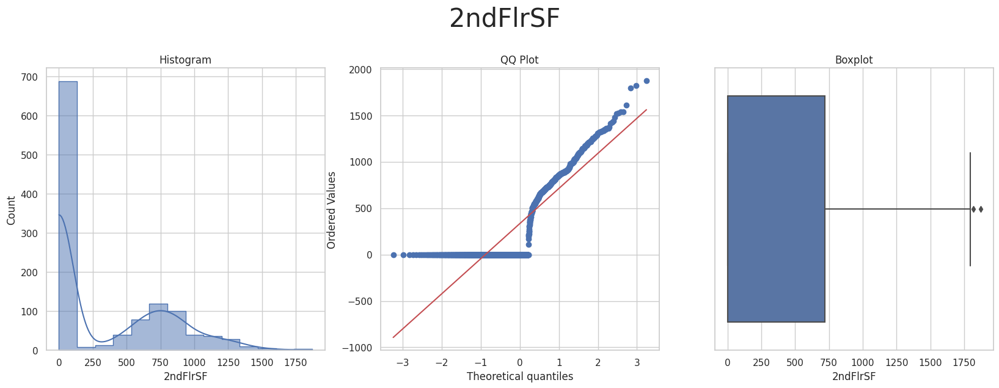

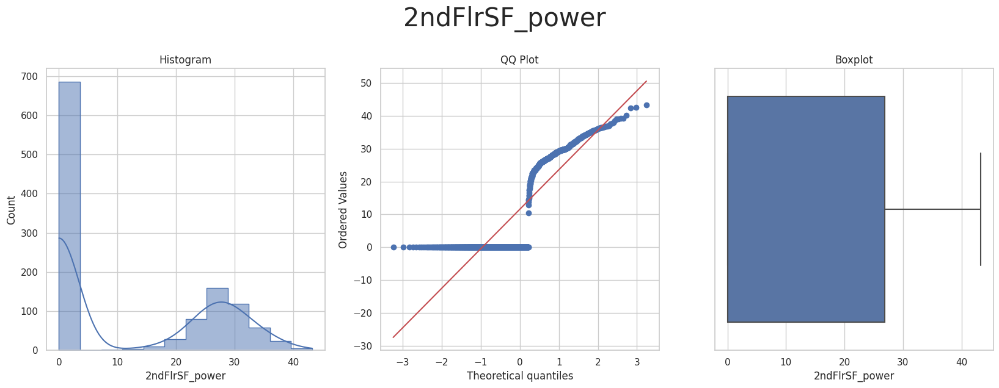

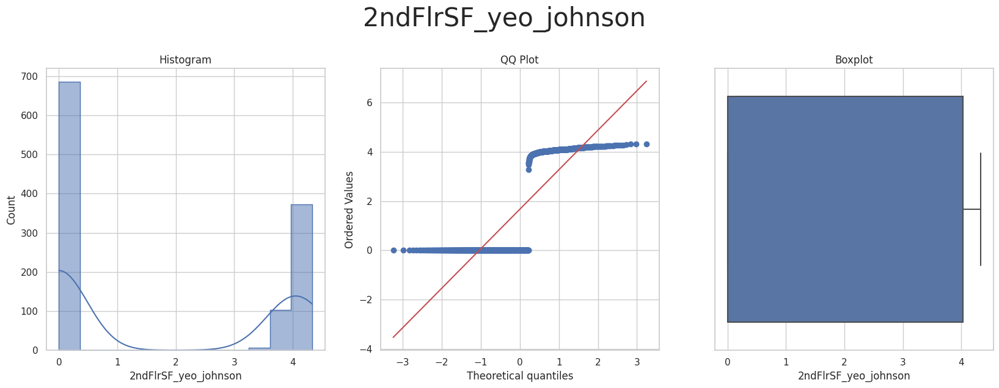



* Variable Analyzed: BedroomAbvGr
* Applied transformation: ['BedroomAbvGr_power', 'BedroomAbvGr_yeo_johnson'] 



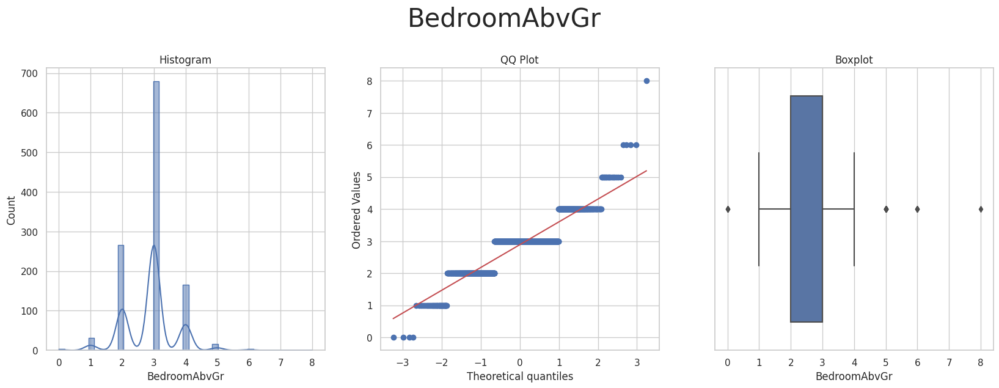

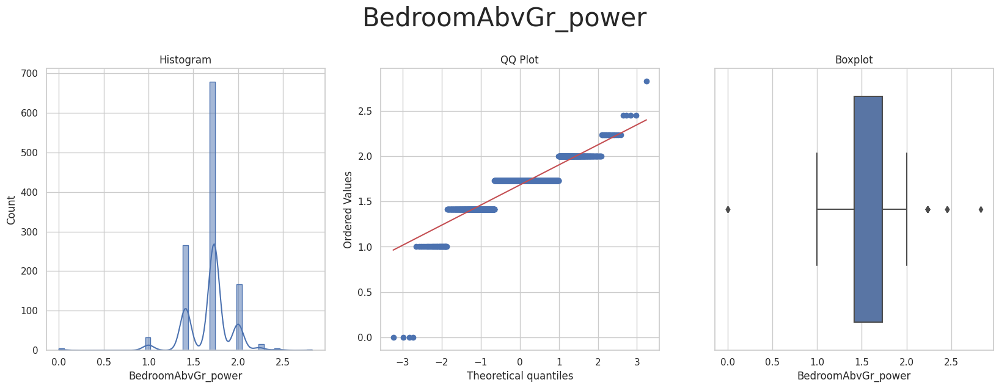

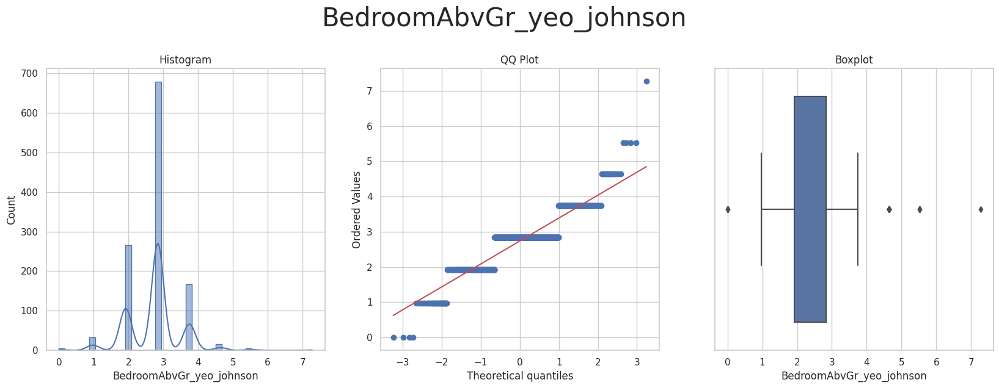



* Variable Analyzed: BsmtFinSF1
* Applied transformation: ['BsmtFinSF1_power', 'BsmtFinSF1_yeo_johnson'] 



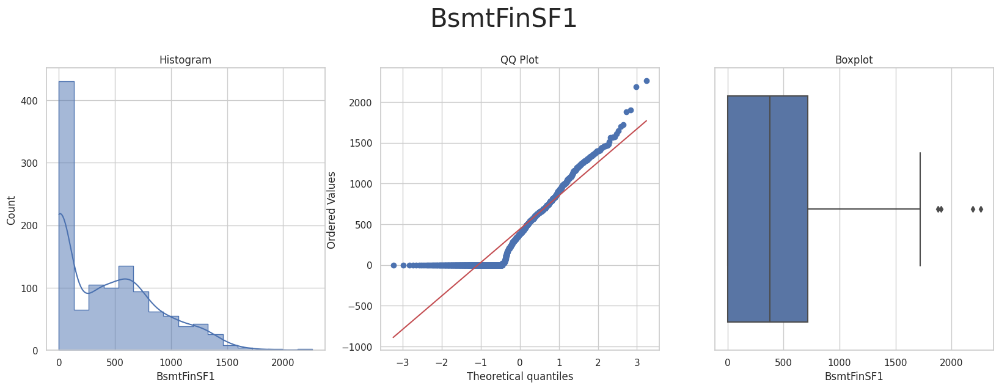

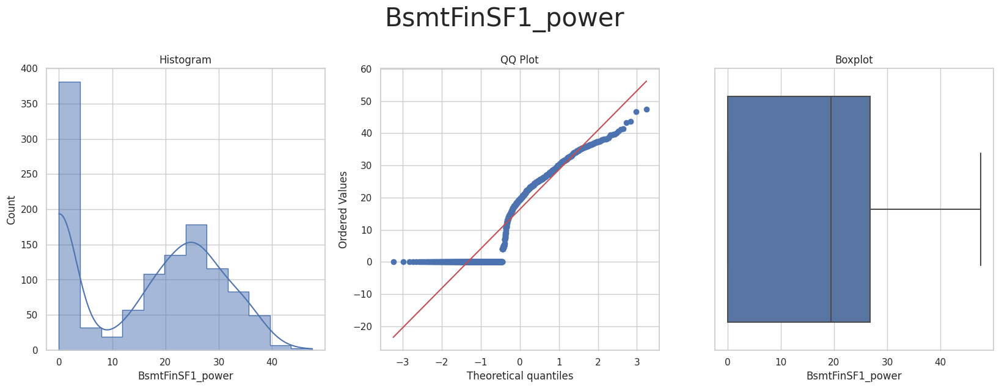

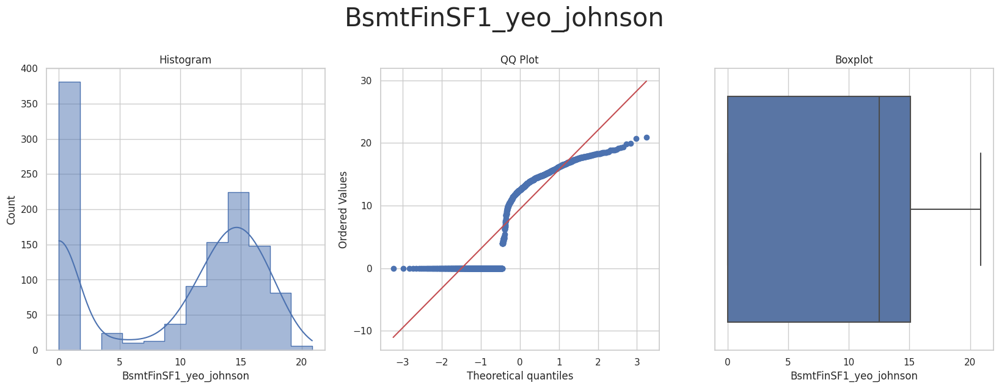



* Variable Analyzed: BsmtUnfSF
* Applied transformation: ['BsmtUnfSF_power', 'BsmtUnfSF_yeo_johnson'] 



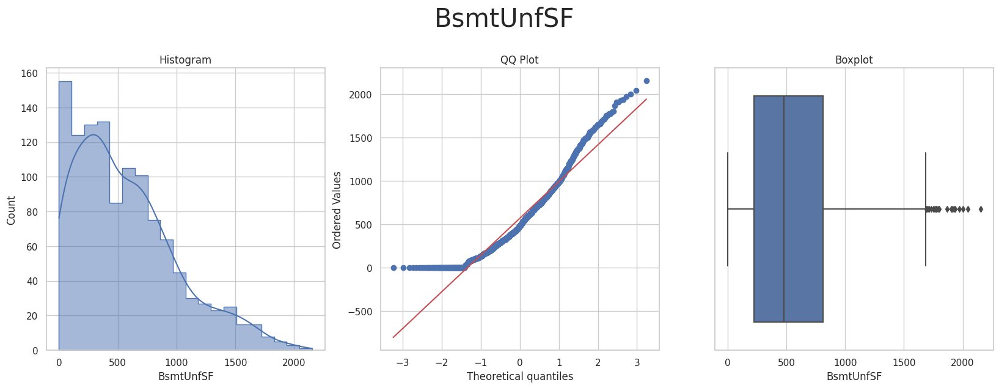

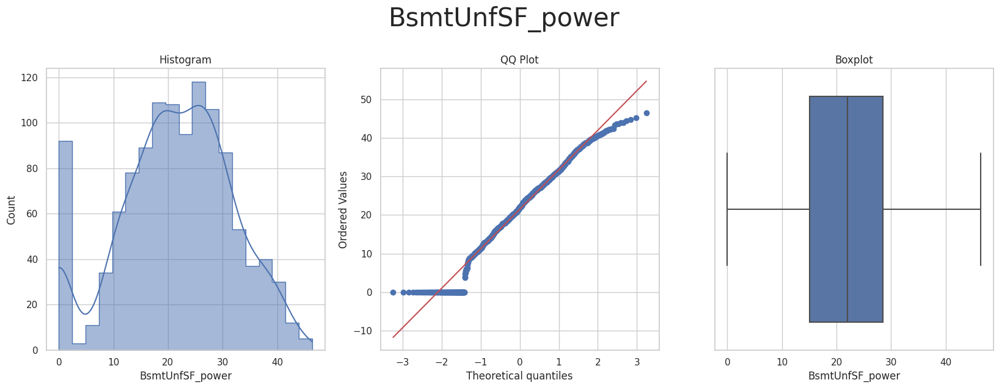

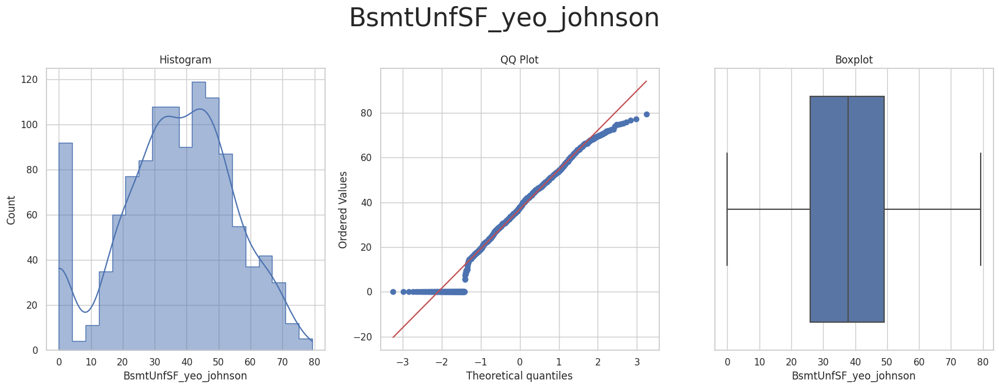



* Variable Analyzed: GarageArea
* Applied transformation: ['GarageArea_power', 'GarageArea_yeo_johnson'] 



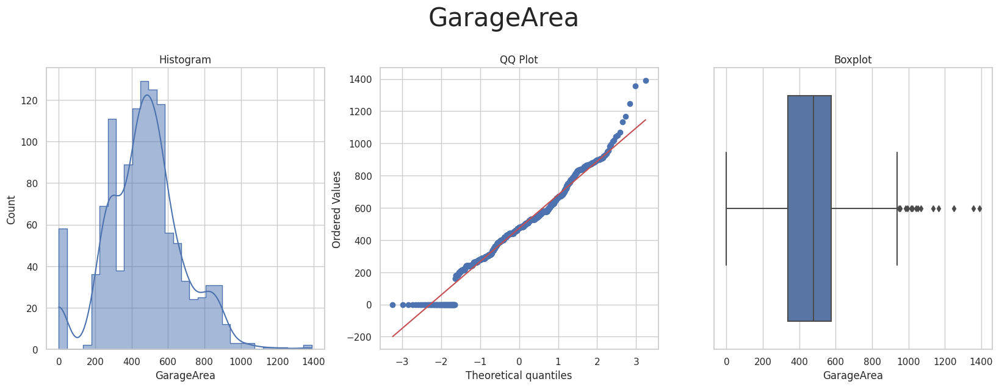

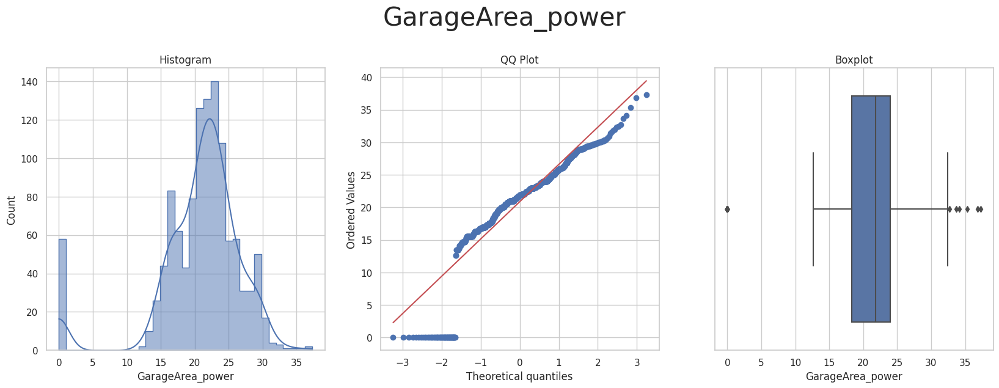

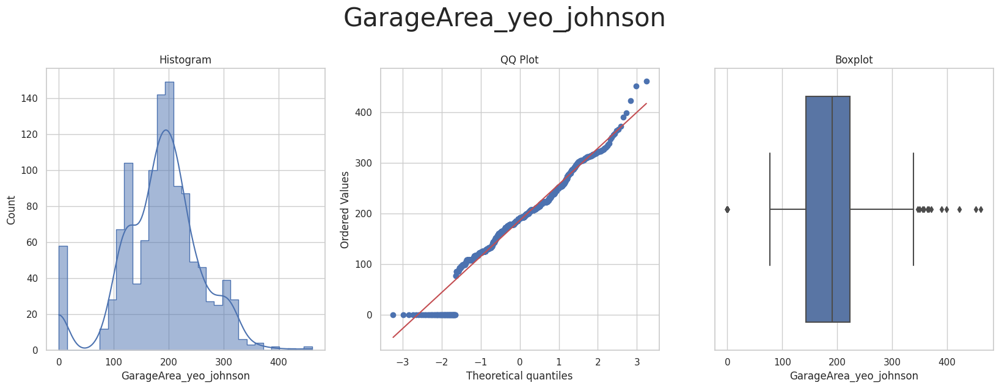



* Variable Analyzed: GarageYrBlt
* Applied transformation: ['GarageYrBlt_log_e', 'GarageYrBlt_log_10', 'GarageYrBlt_reciprocal', 'GarageYrBlt_power', 'GarageYrBlt_box_cox', 'GarageYrBlt_yeo_johnson'] 



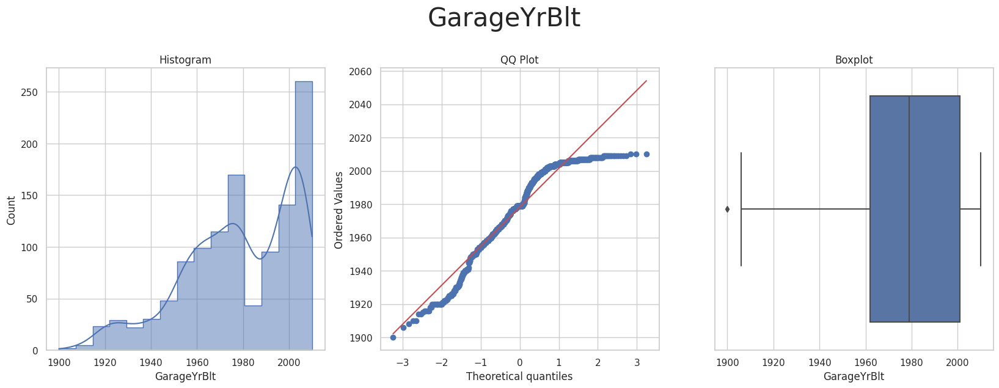

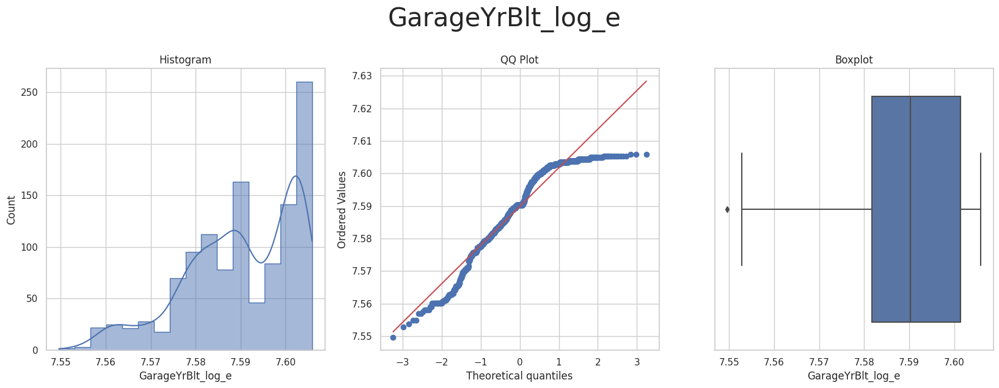

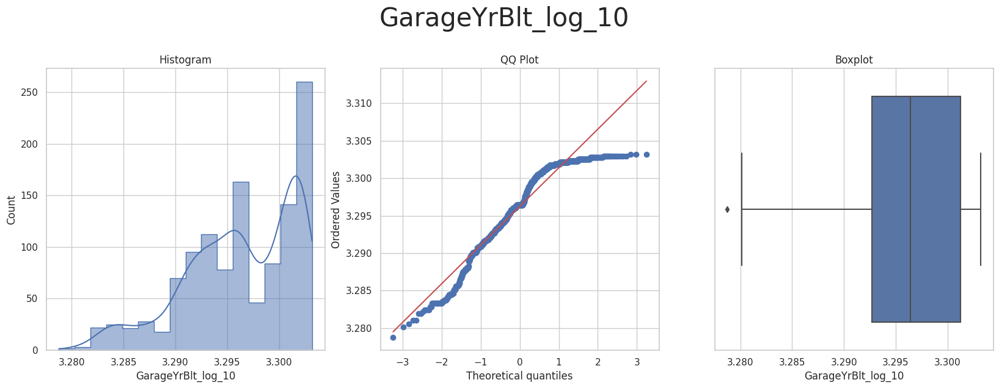

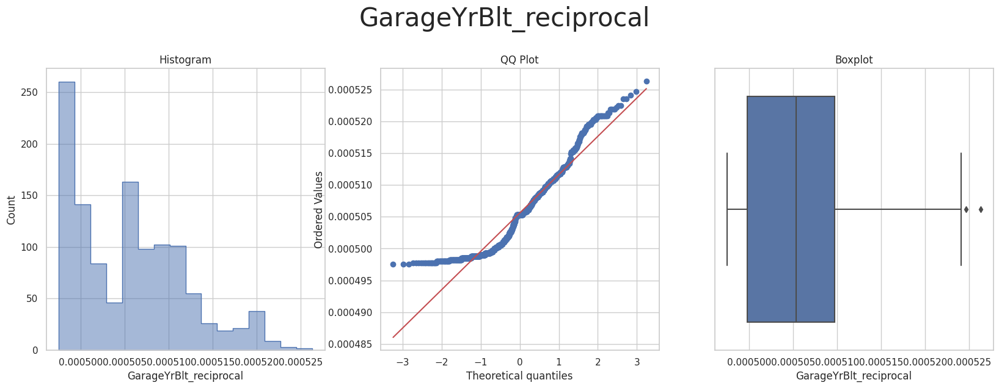

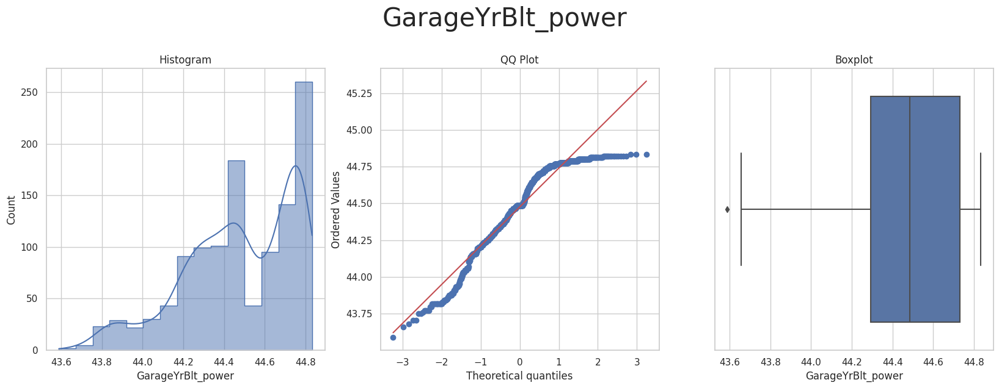

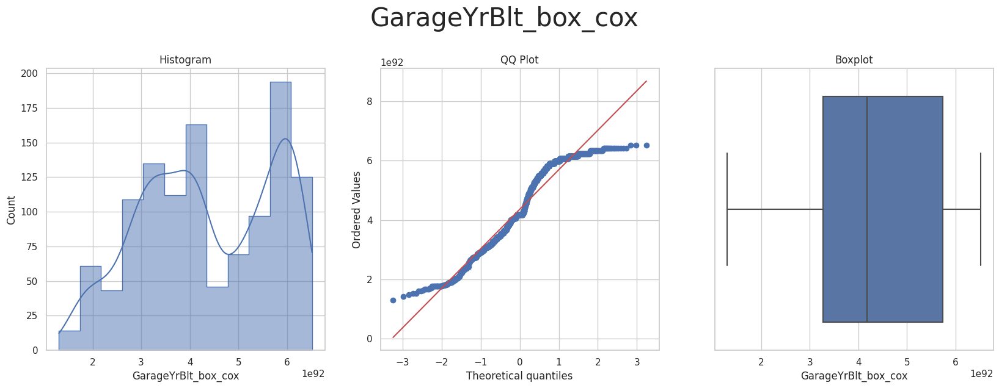

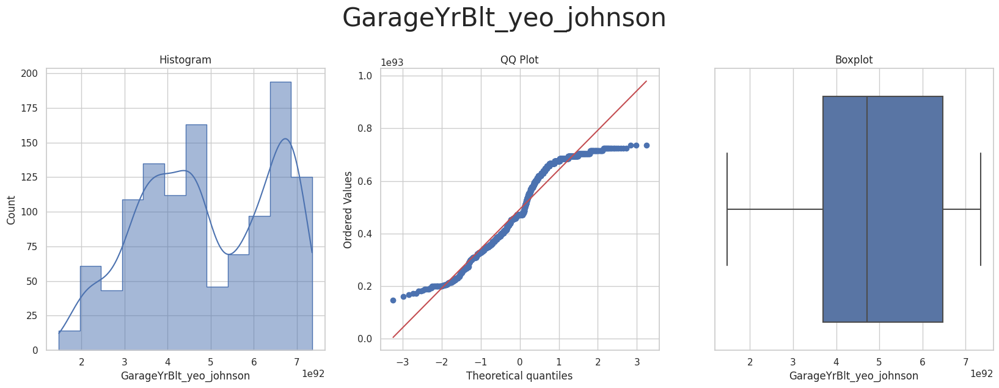



* Variable Analyzed: GrLivArea
* Applied transformation: ['GrLivArea_log_e', 'GrLivArea_log_10', 'GrLivArea_reciprocal', 'GrLivArea_power', 'GrLivArea_box_cox', 'GrLivArea_yeo_johnson'] 



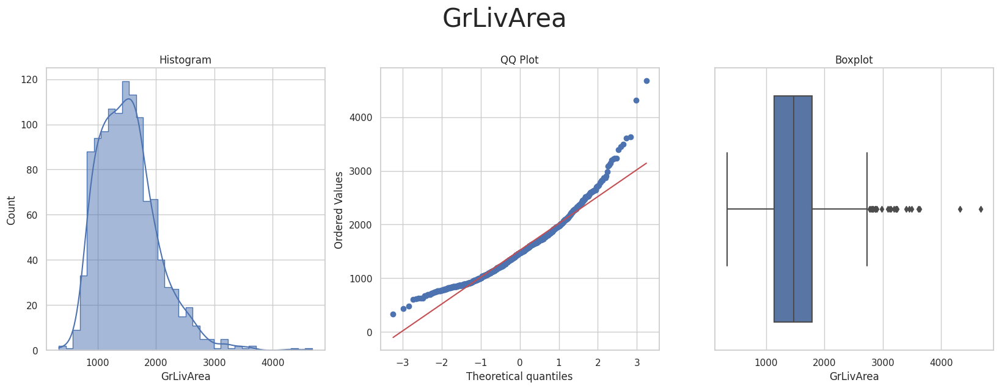

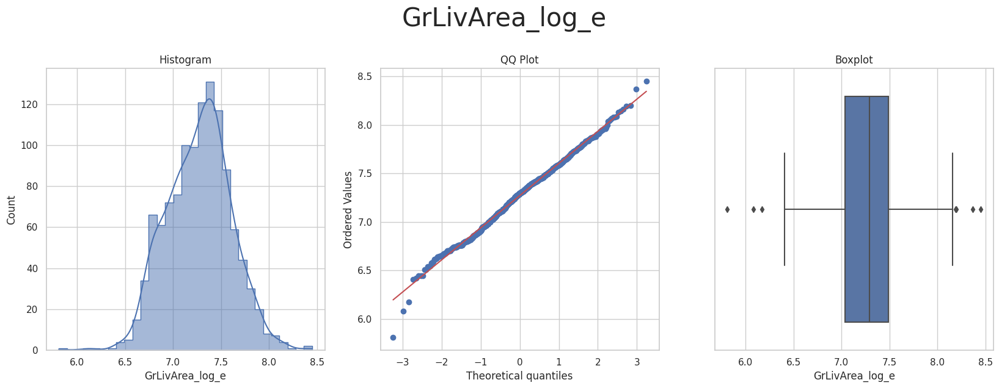

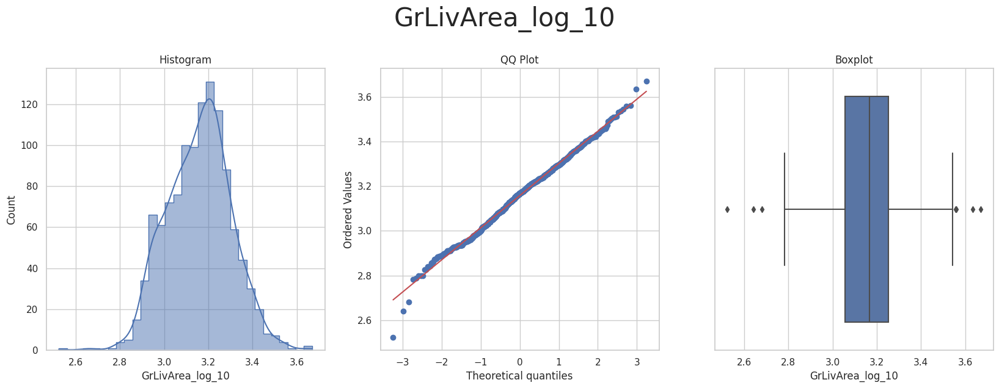

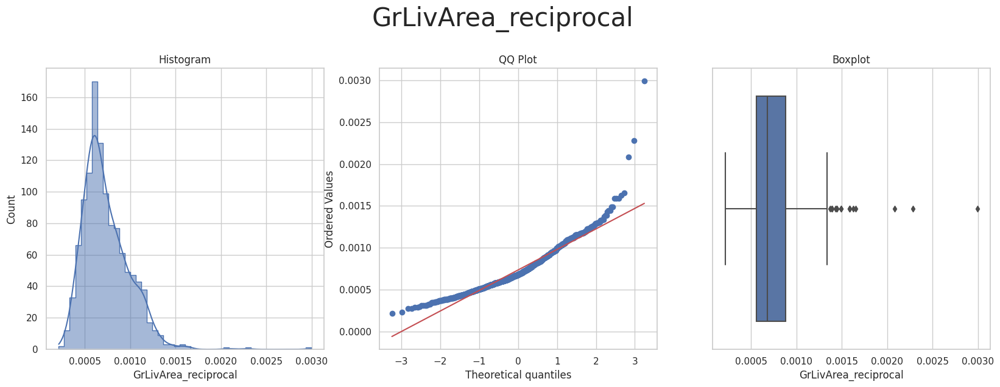

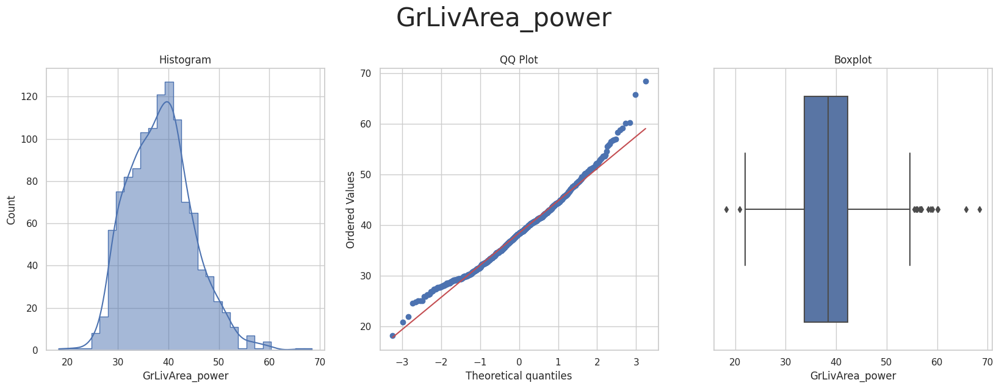

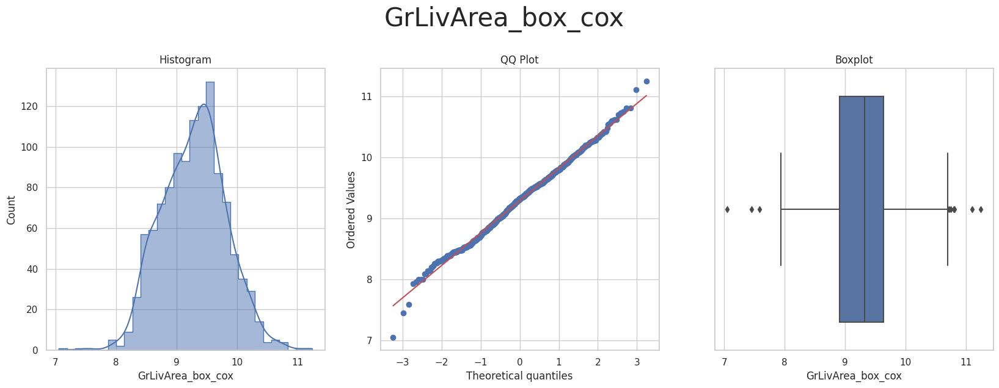

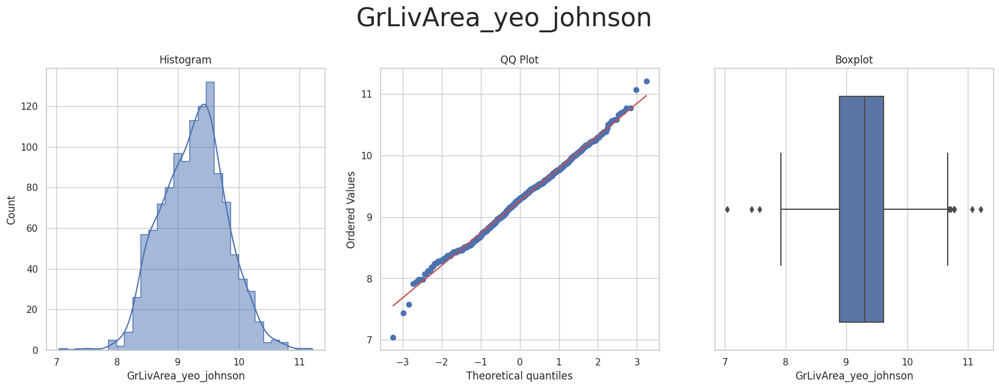



* Variable Analyzed: LotArea
* Applied transformation: ['LotArea_log_e', 'LotArea_log_10', 'LotArea_reciprocal', 'LotArea_power', 'LotArea_box_cox', 'LotArea_yeo_johnson'] 



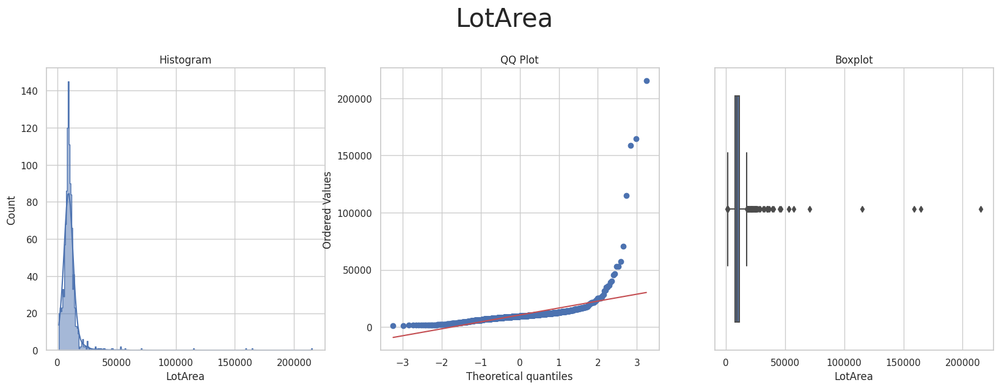

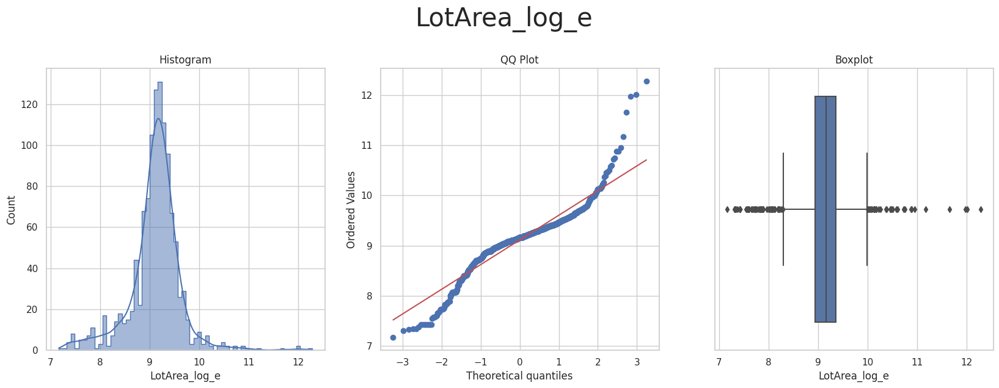

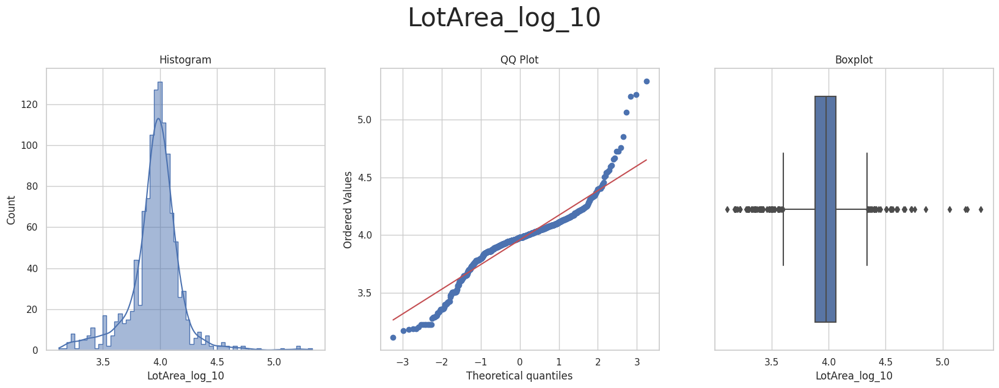

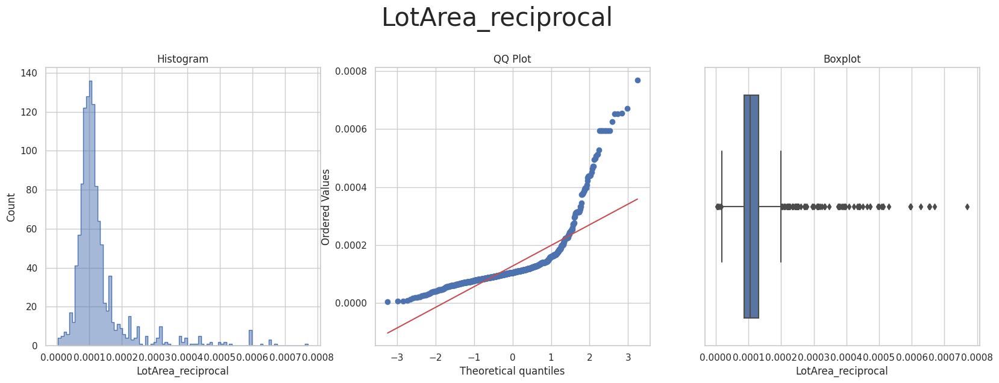

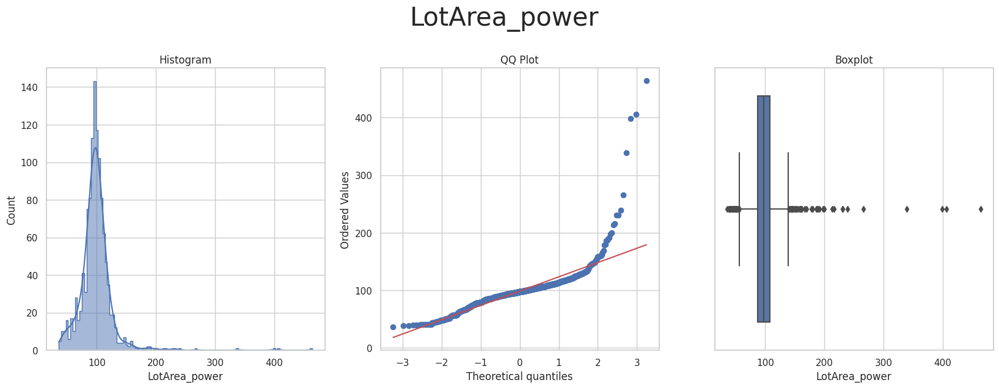

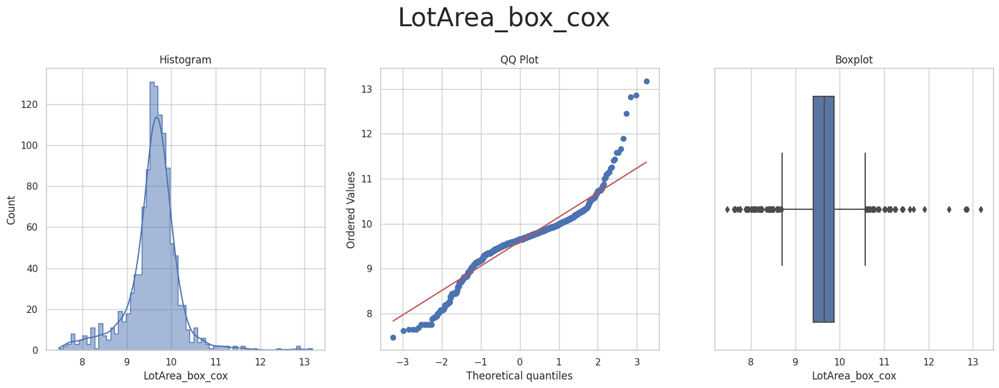

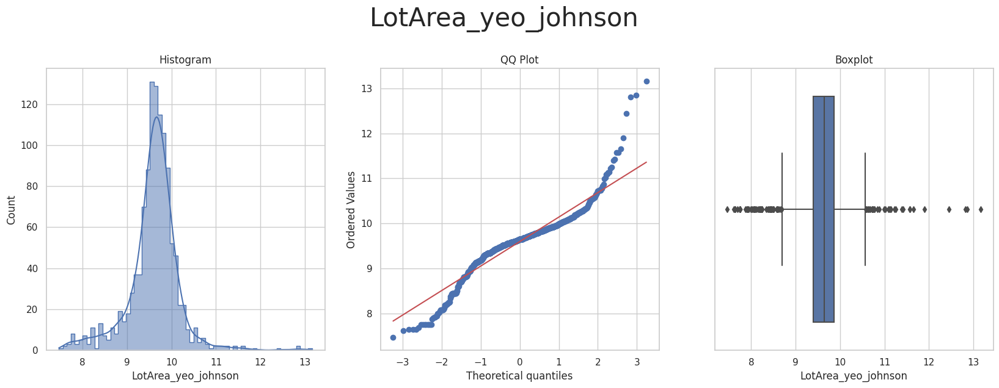



* Variable Analyzed: LotFrontage
* Applied transformation: ['LotFrontage_log_e', 'LotFrontage_log_10', 'LotFrontage_reciprocal', 'LotFrontage_power', 'LotFrontage_box_cox', 'LotFrontage_yeo_johnson'] 



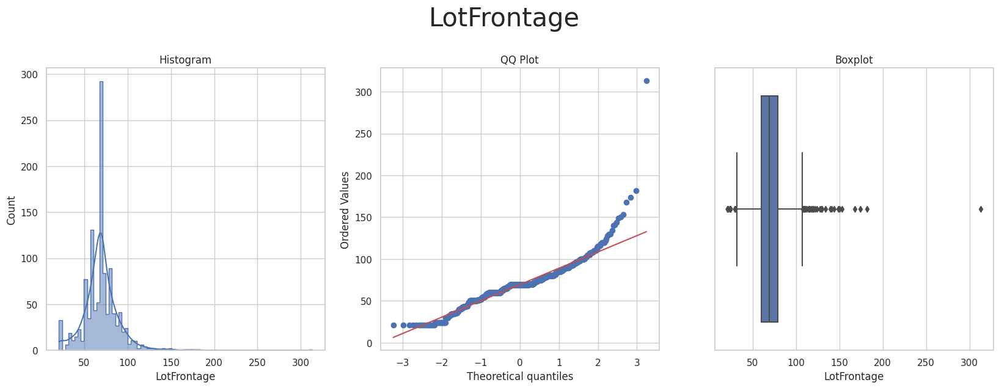

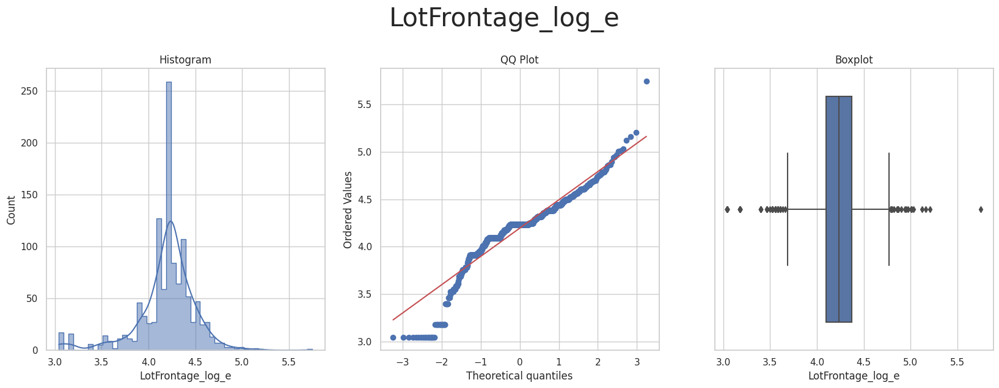

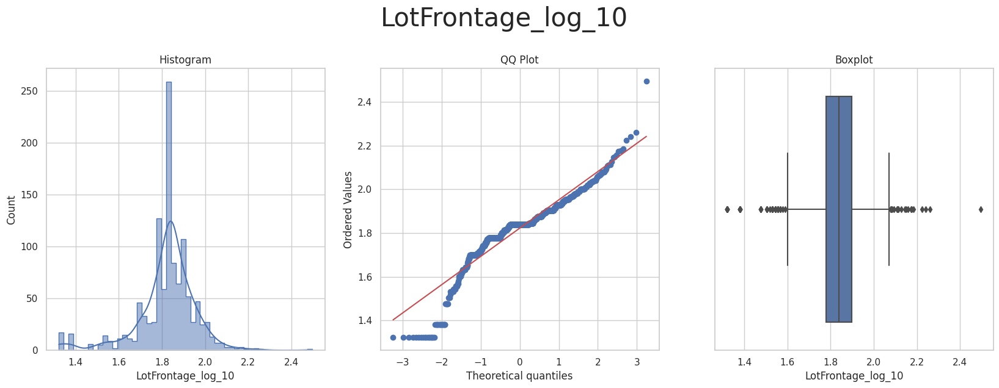

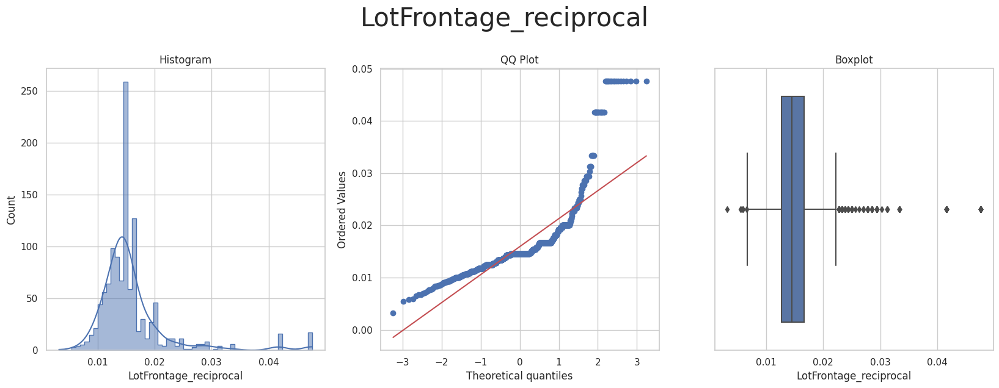

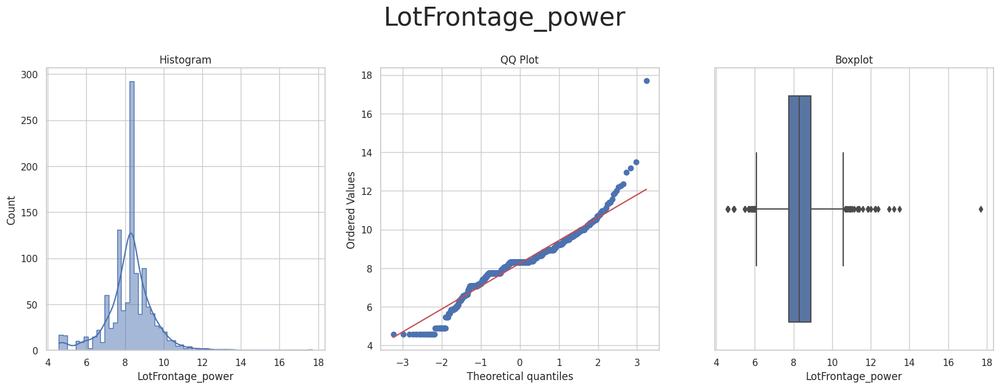

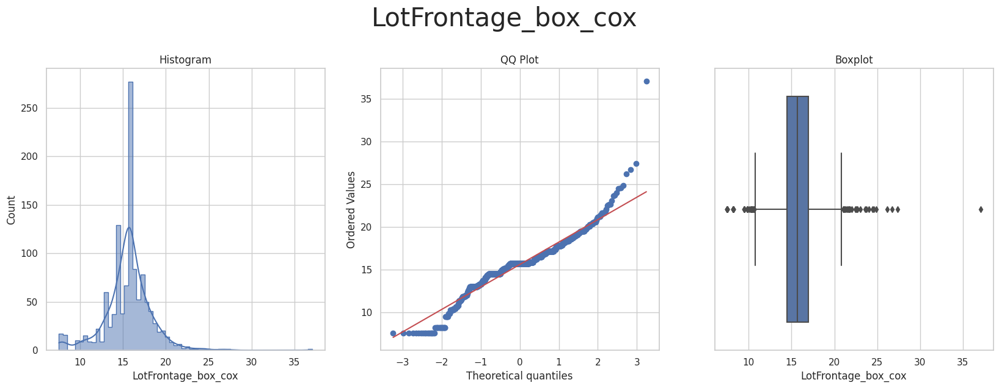

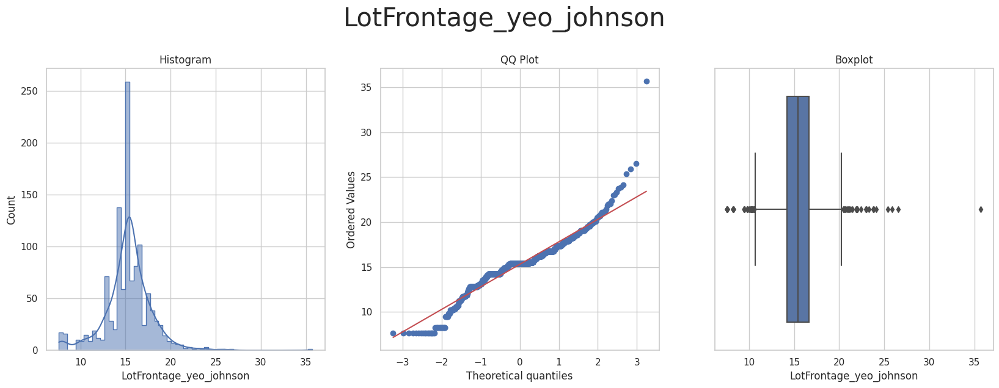



* Variable Analyzed: MasVnrArea
* Applied transformation: ['MasVnrArea_power', 'MasVnrArea_yeo_johnson'] 



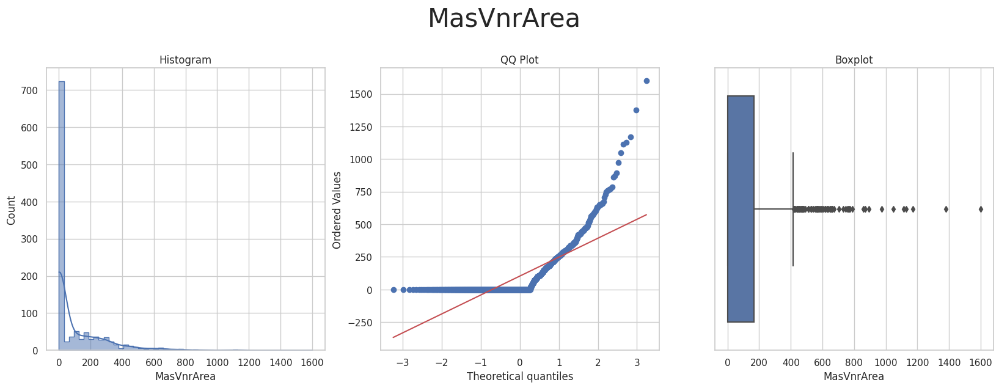

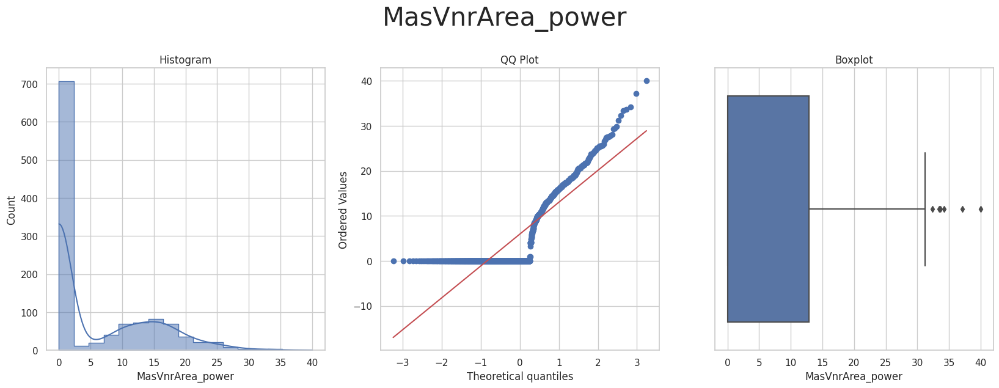

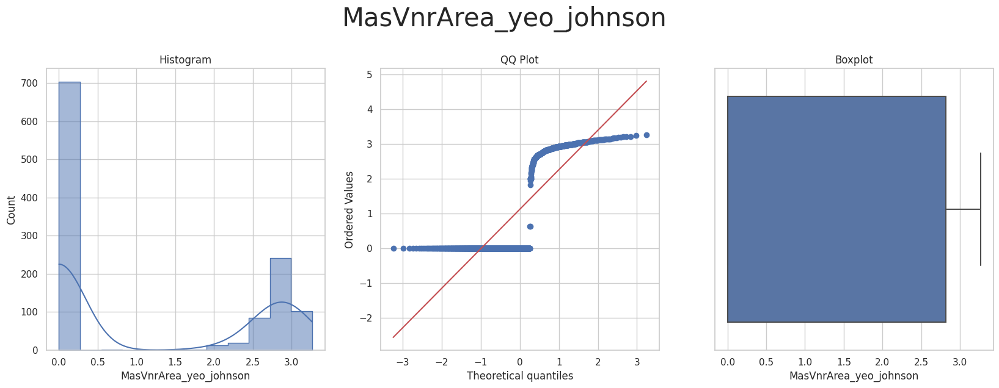



* Variable Analyzed: OpenPorchSF
* Applied transformation: ['OpenPorchSF_power', 'OpenPorchSF_yeo_johnson'] 



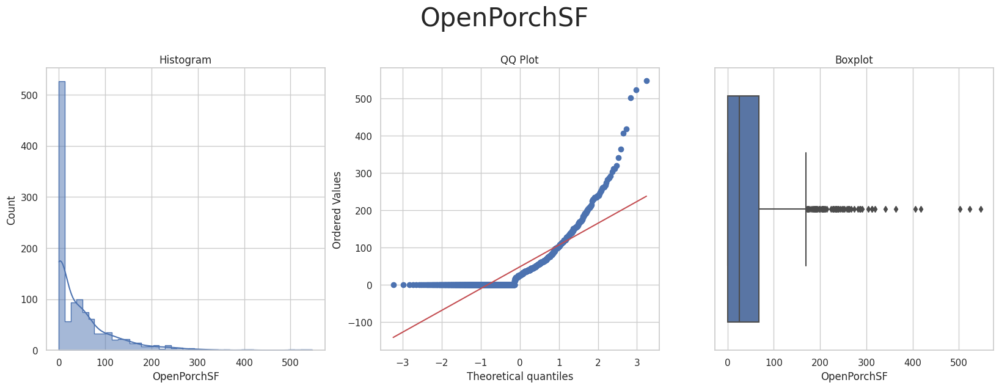

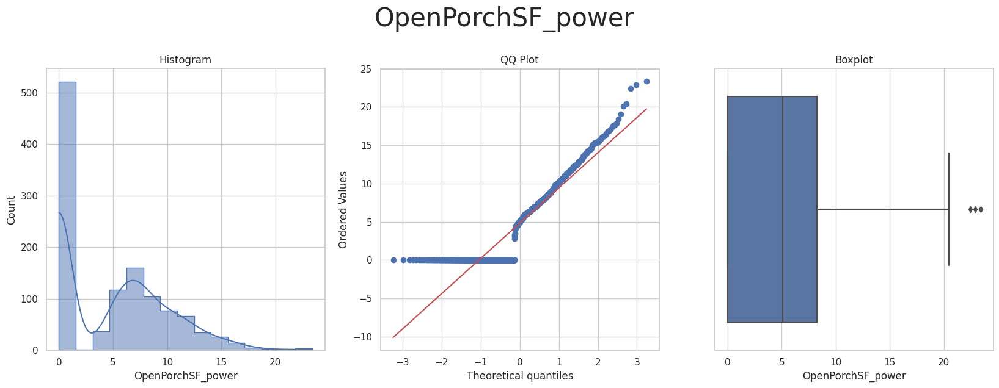

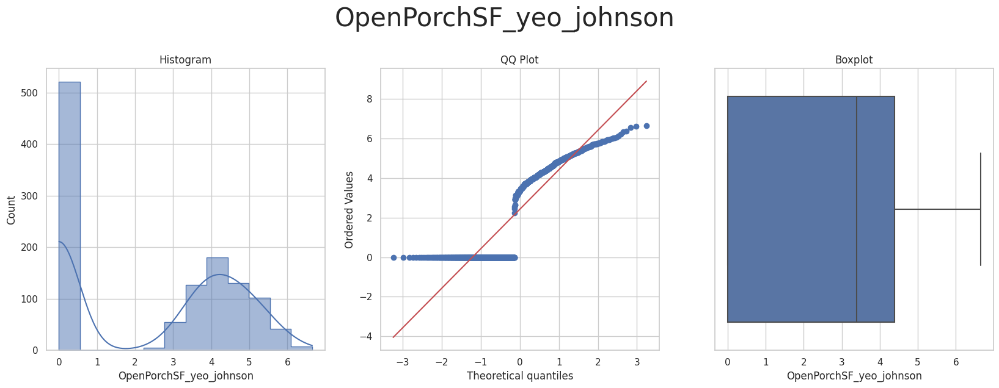



* Variable Analyzed: OverallCond
* Applied transformation: ['OverallCond_log_e', 'OverallCond_log_10', 'OverallCond_reciprocal', 'OverallCond_power', 'OverallCond_box_cox', 'OverallCond_yeo_johnson'] 



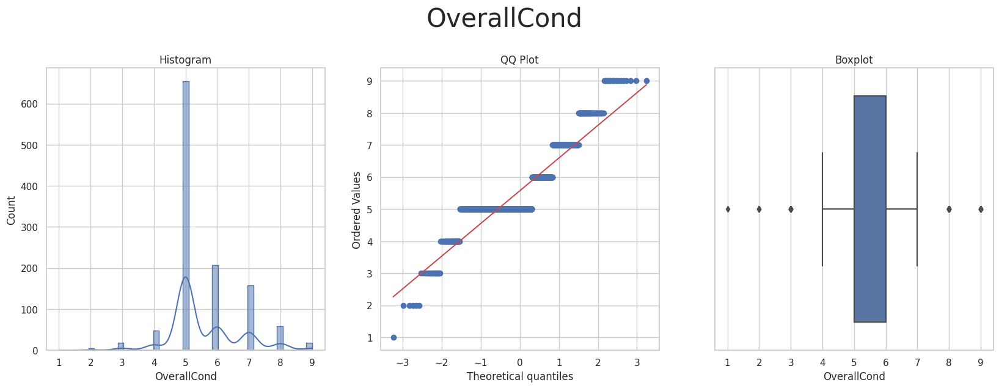

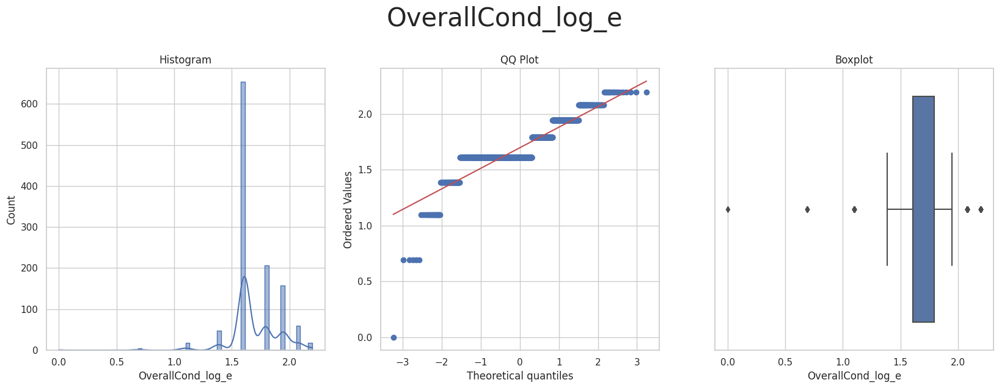

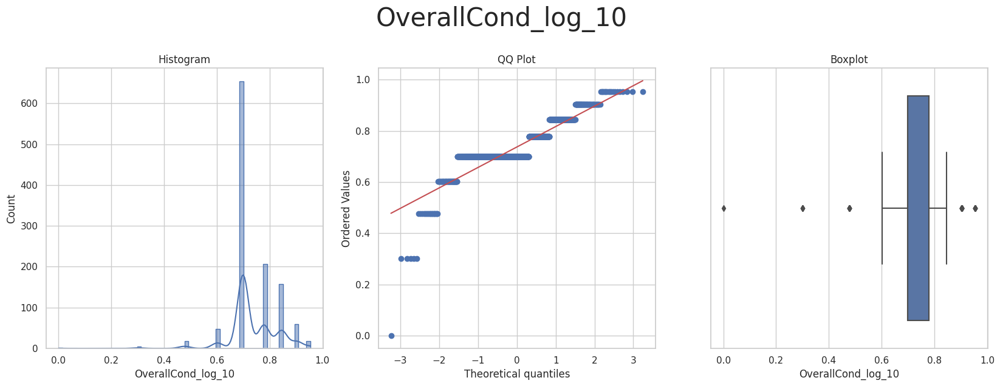

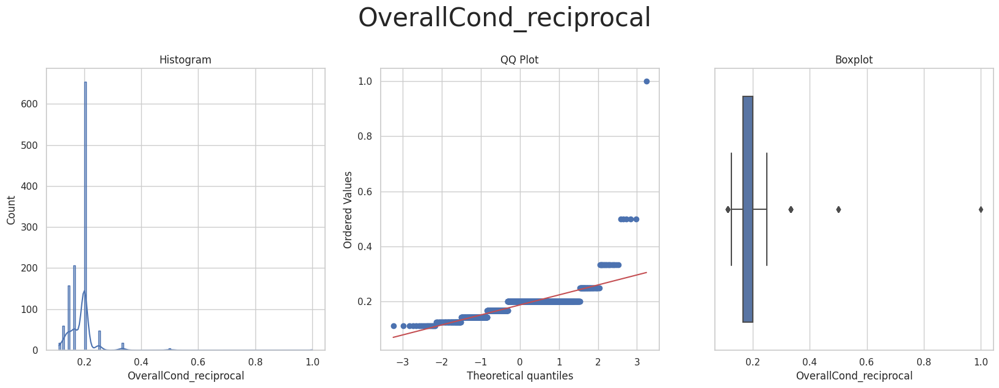

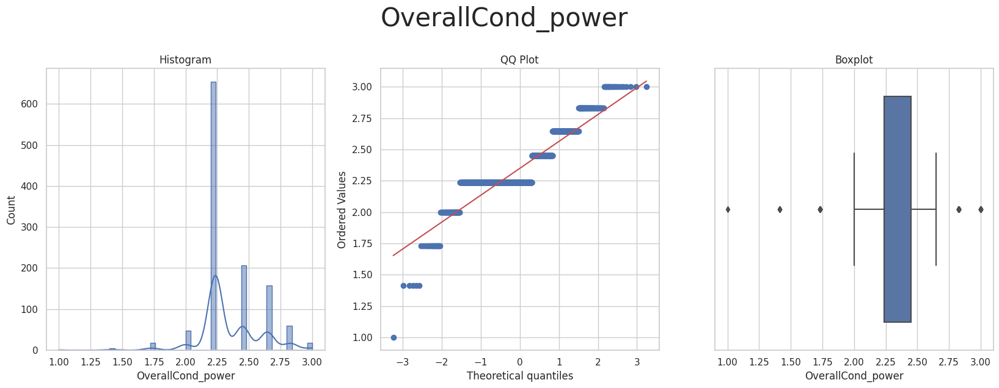

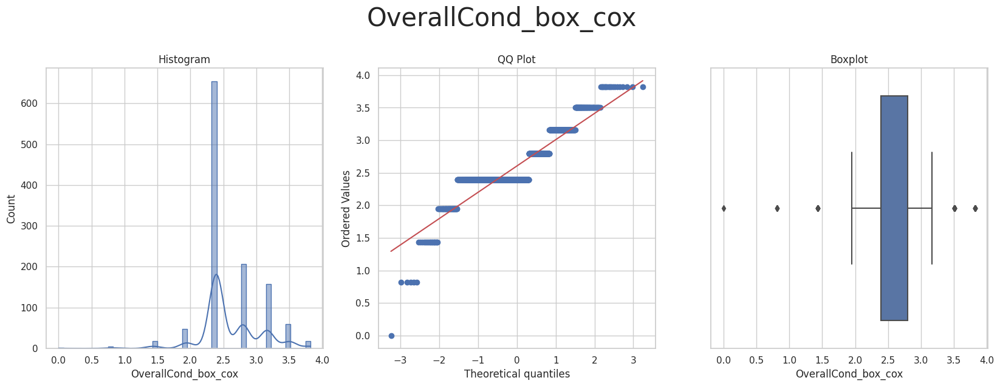

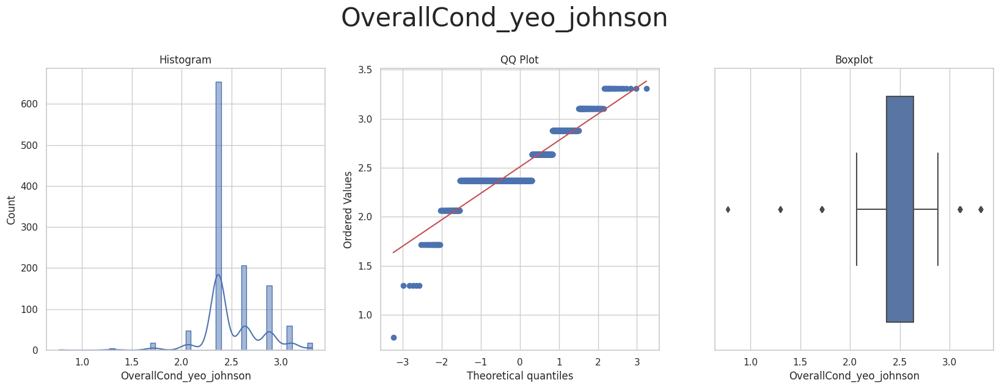



* Variable Analyzed: OverallQual
* Applied transformation: ['OverallQual_log_e', 'OverallQual_log_10', 'OverallQual_reciprocal', 'OverallQual_power', 'OverallQual_box_cox', 'OverallQual_yeo_johnson'] 



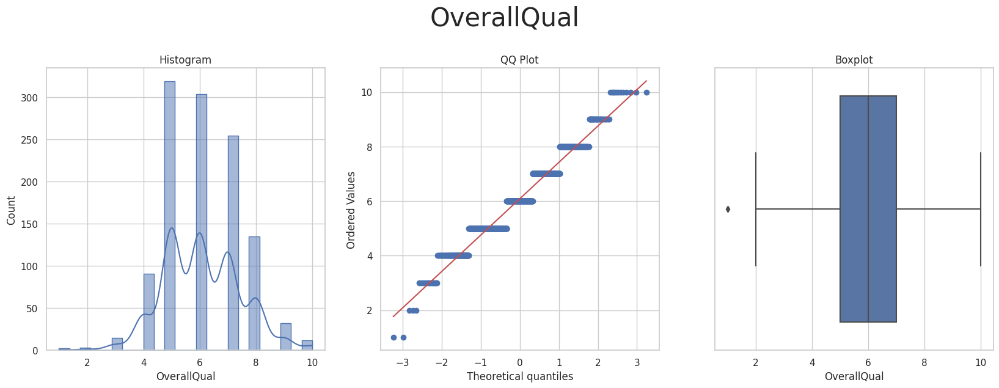

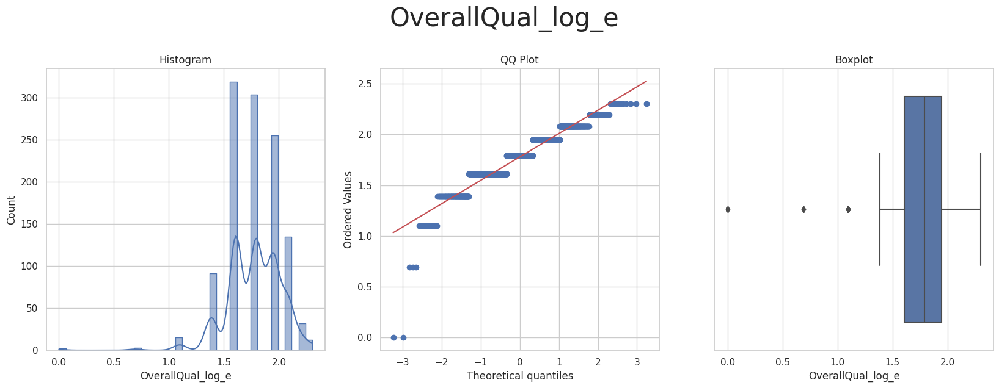

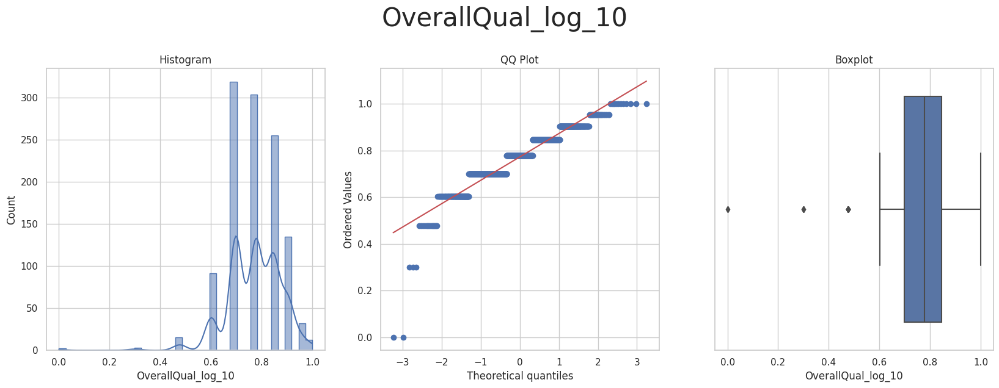

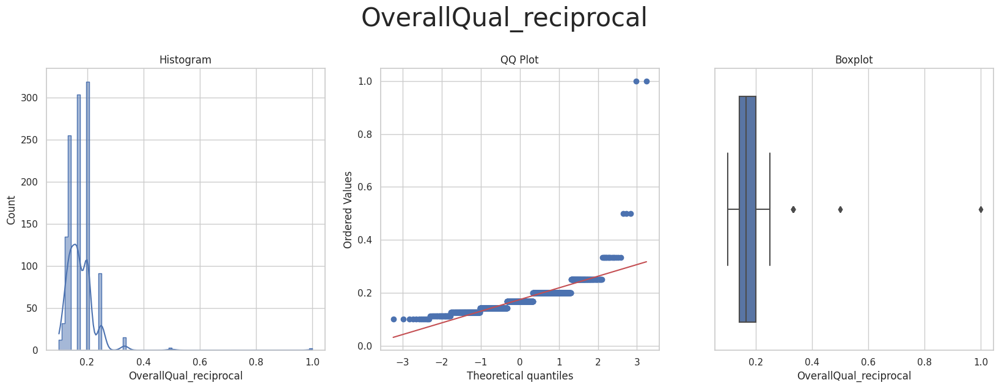

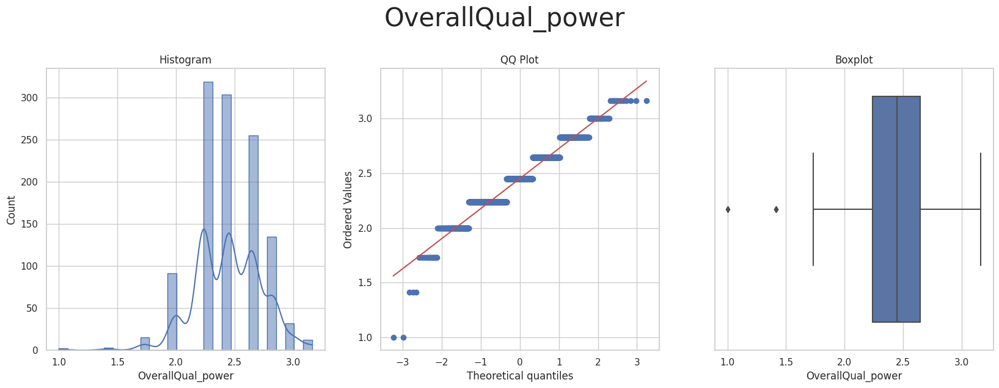

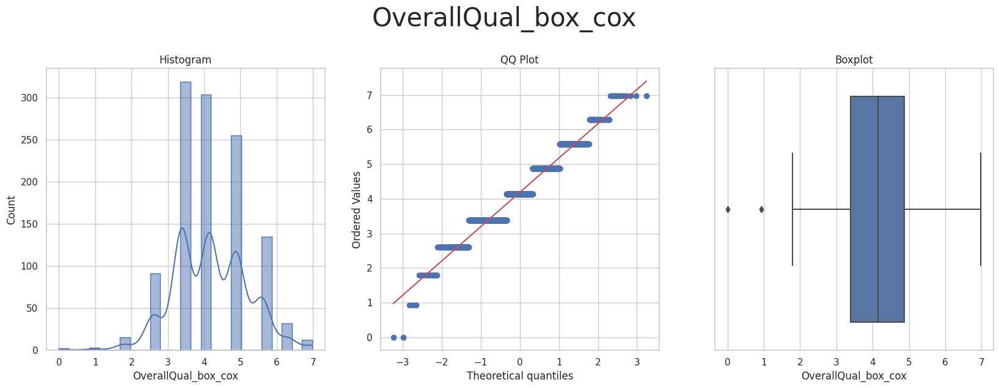

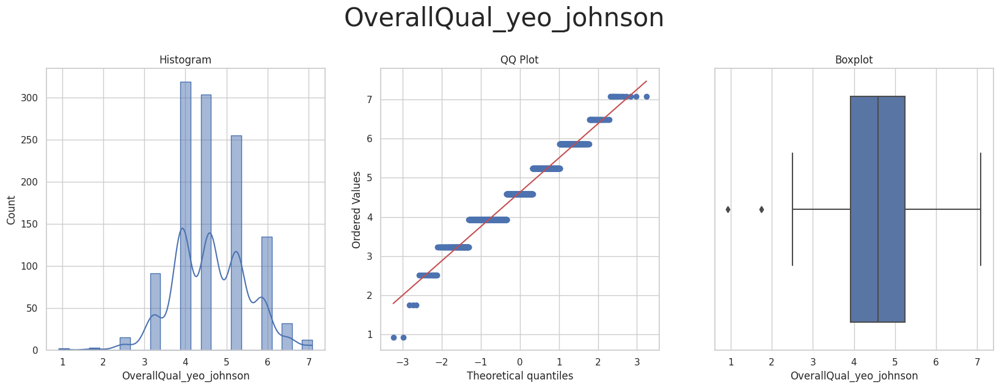



* Variable Analyzed: TotalBsmtSF
* Applied transformation: ['TotalBsmtSF_power', 'TotalBsmtSF_yeo_johnson'] 



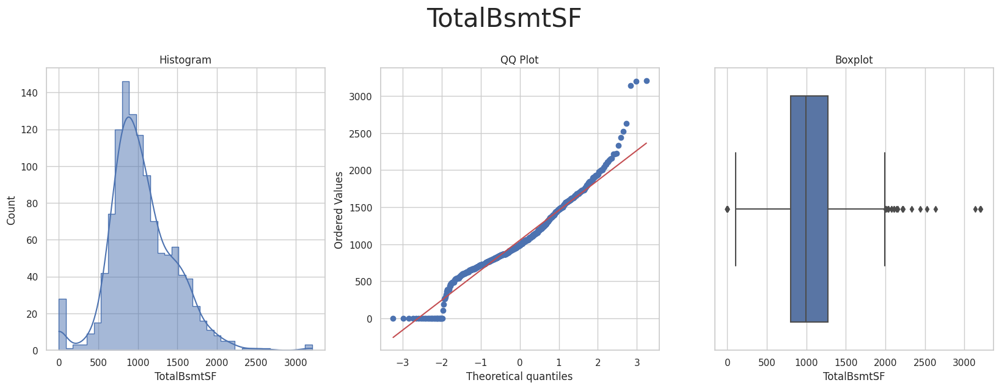

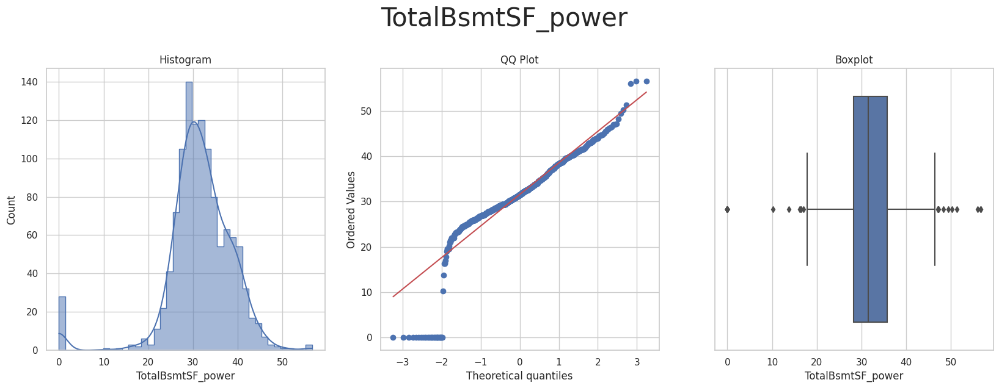

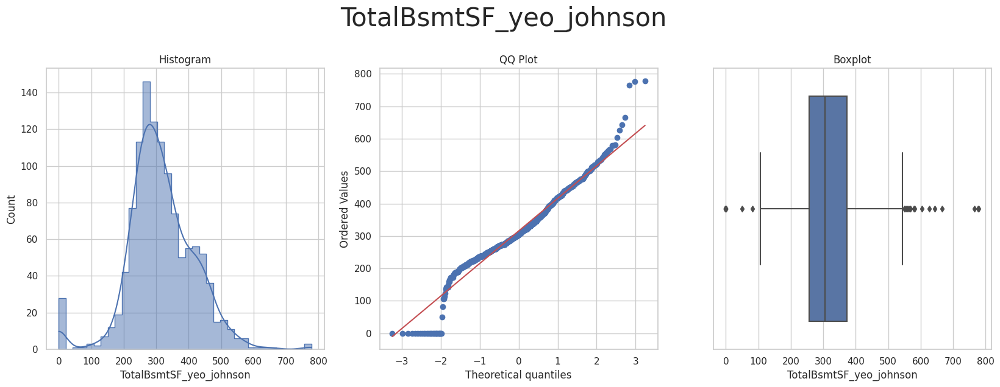



* Variable Analyzed: YearBuilt
* Applied transformation: ['YearBuilt_log_e', 'YearBuilt_log_10', 'YearBuilt_reciprocal', 'YearBuilt_power', 'YearBuilt_box_cox', 'YearBuilt_yeo_johnson'] 



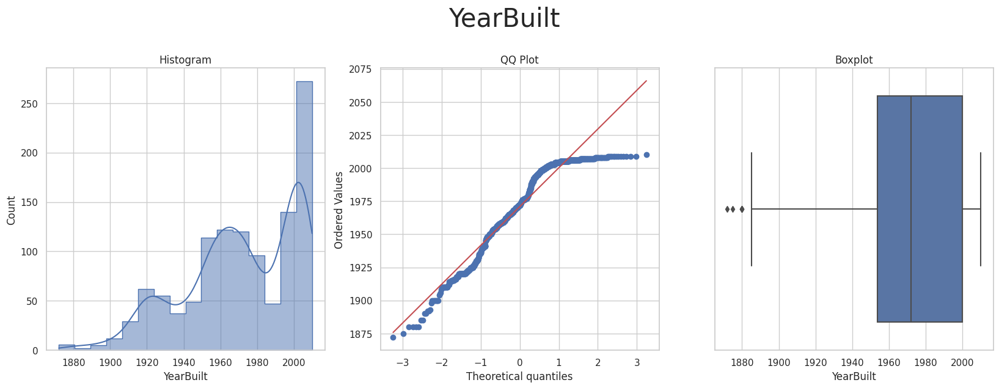

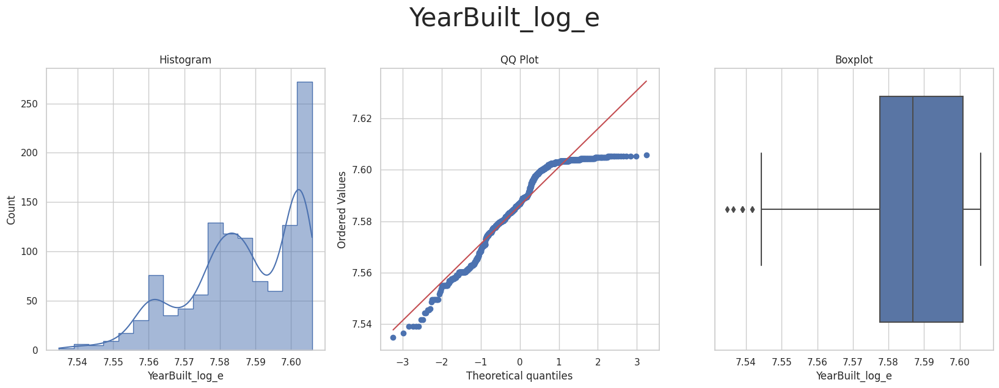

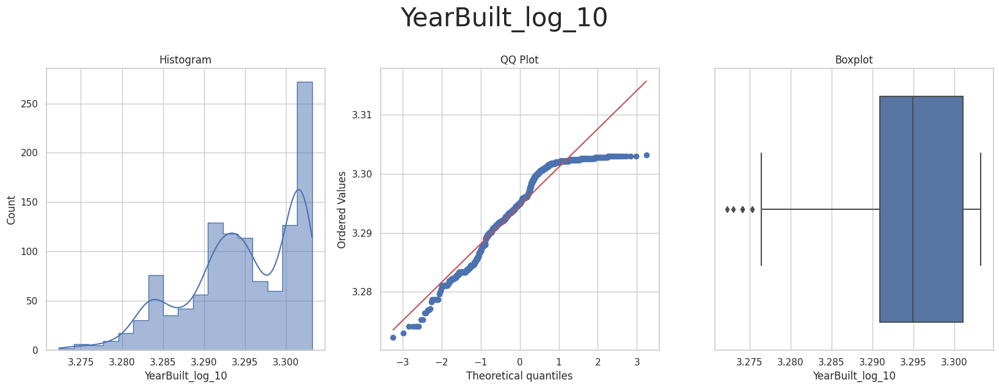

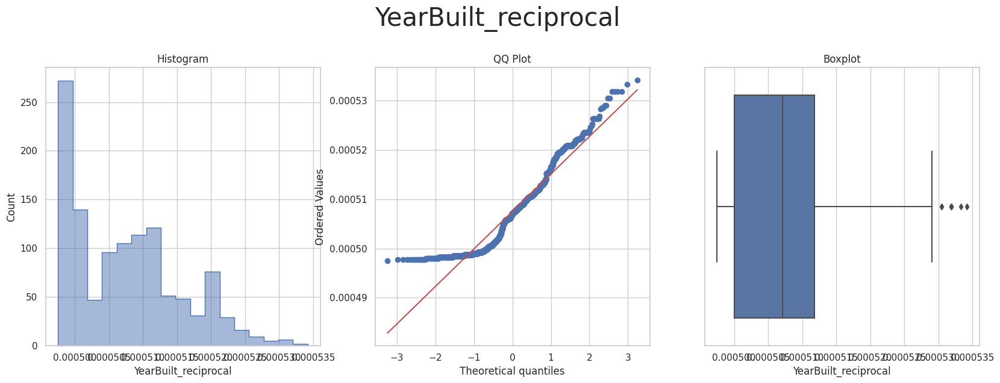

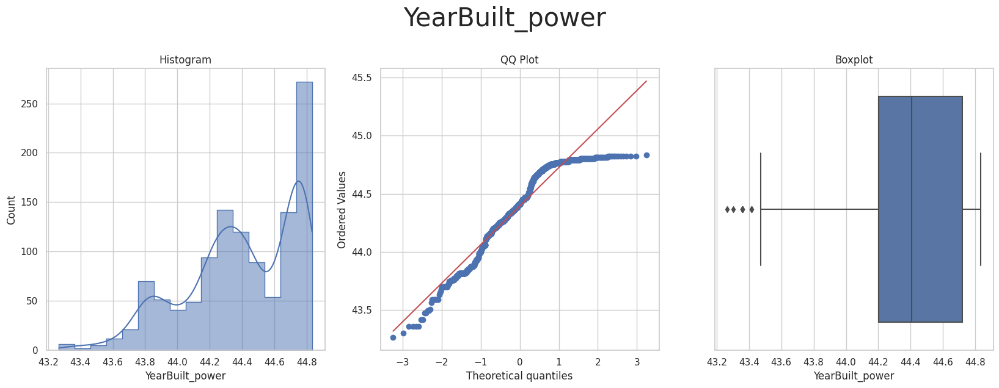

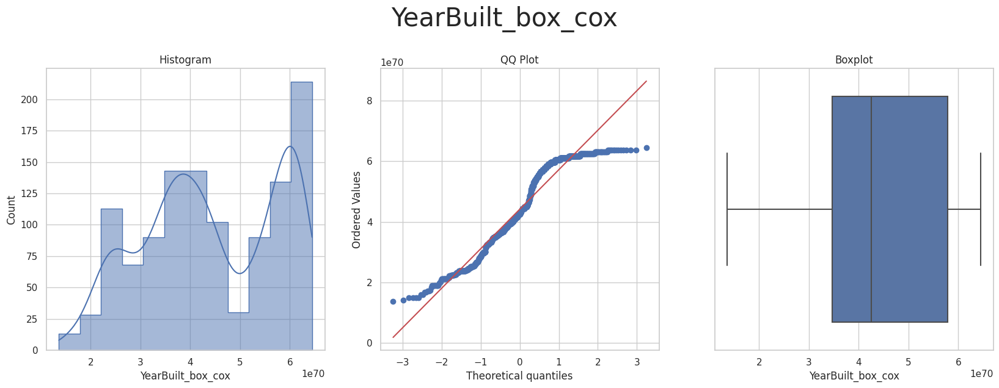

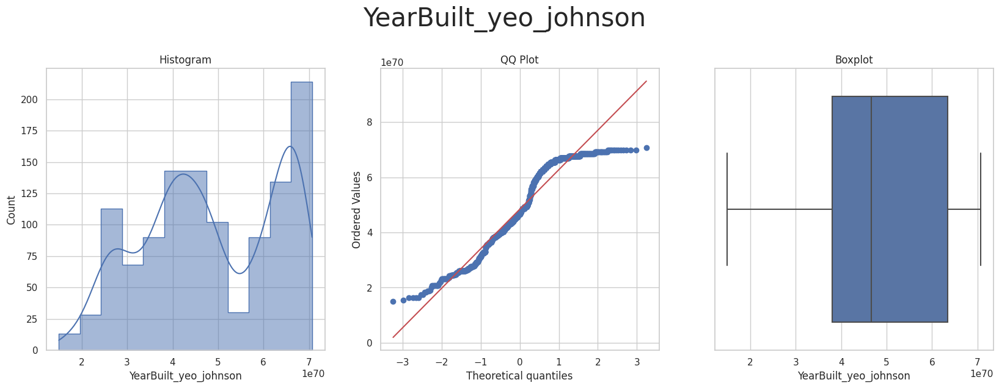



* Variable Analyzed: YearRemodAdd
* Applied transformation: ['YearRemodAdd_log_e', 'YearRemodAdd_log_10', 'YearRemodAdd_reciprocal', 'YearRemodAdd_power', 'YearRemodAdd_box_cox', 'YearRemodAdd_yeo_johnson'] 



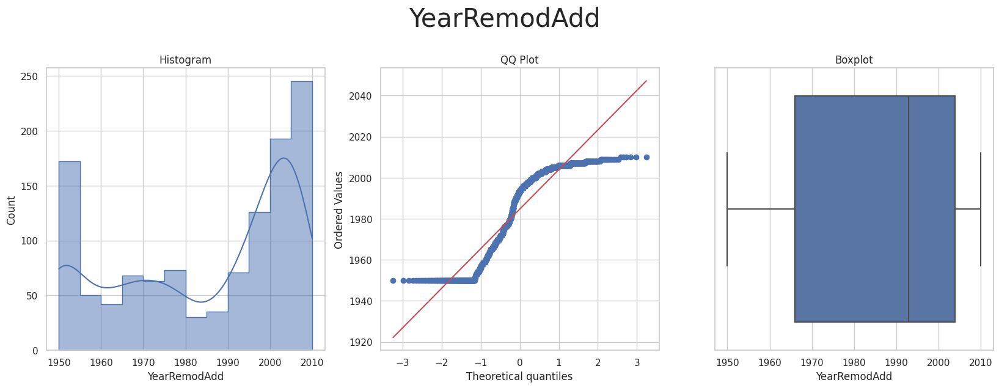

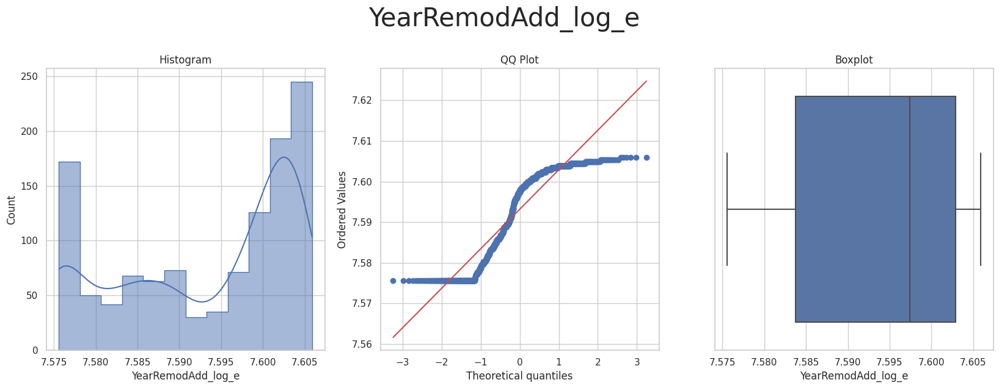

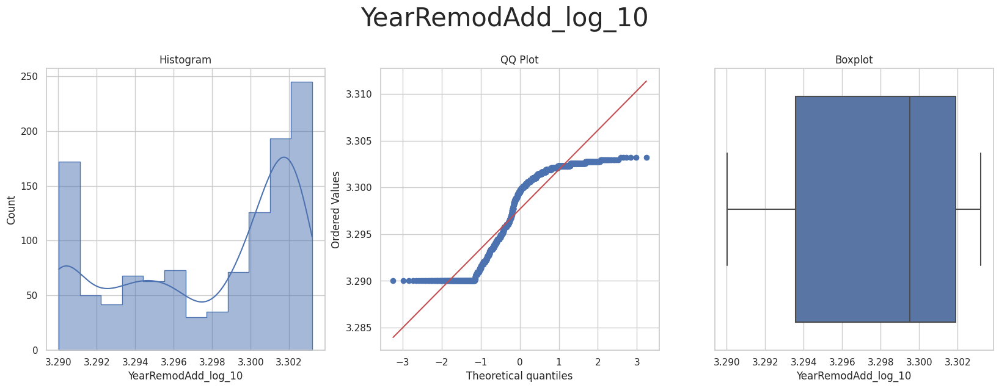

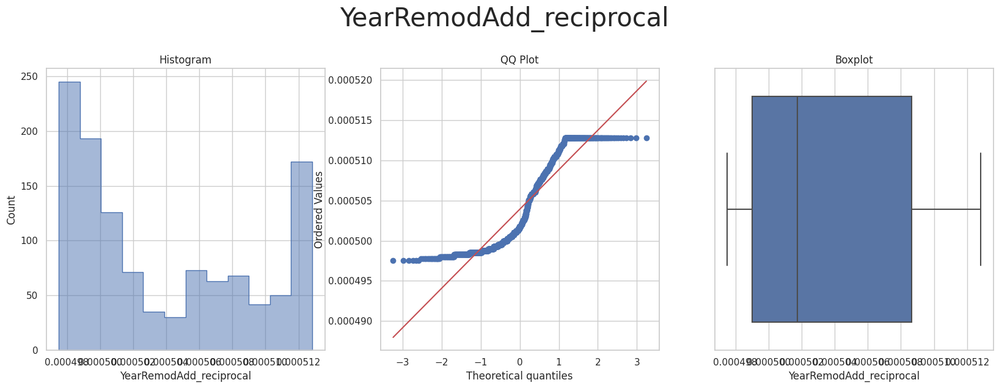

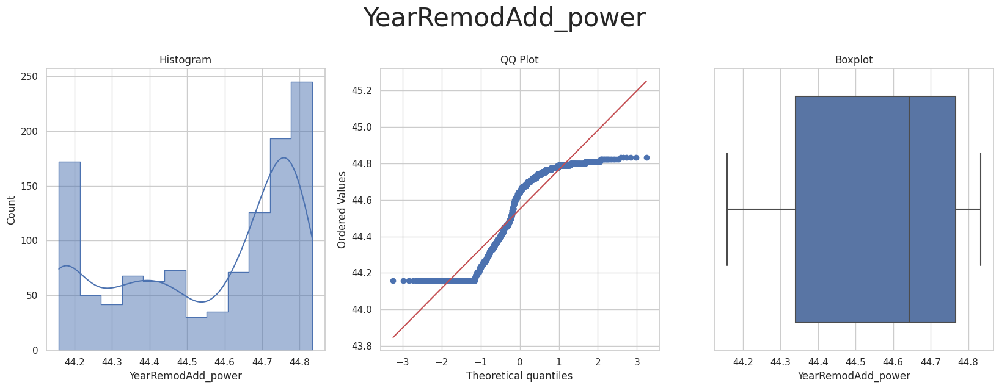

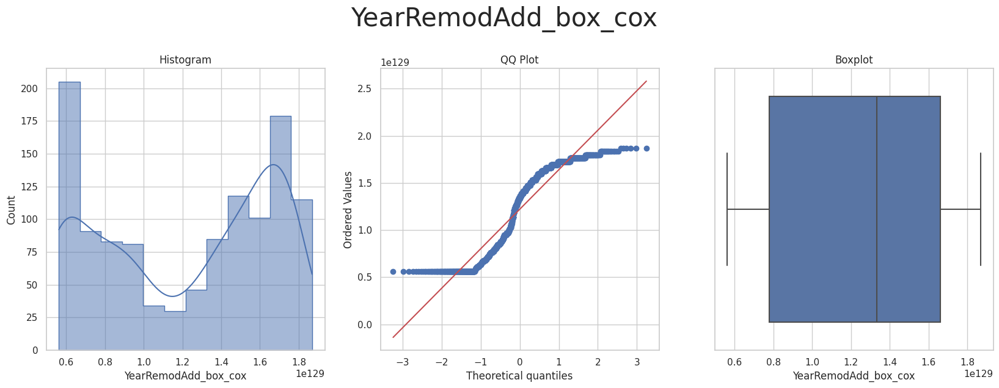

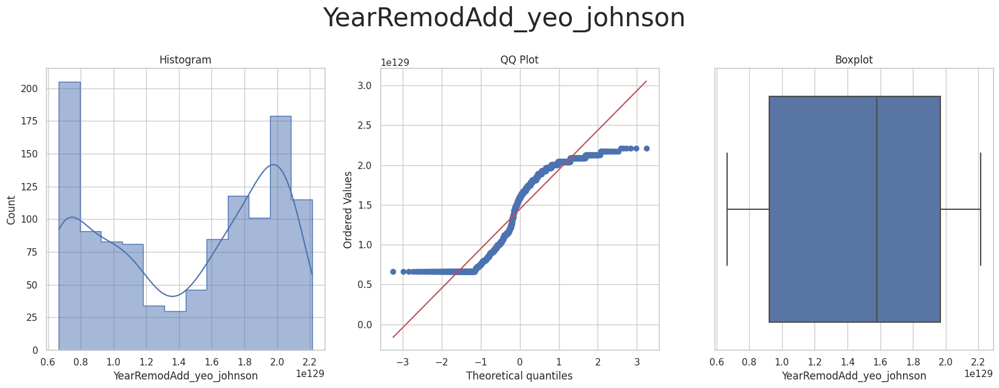

In [19]:
df_engineering = FeatureEngineeringAnalysis(df=df_engineering,analysis_type='numerical')

### Feature Analysis

- 1stFlrSF: The Yeo-Johnson transformer produced a distribution closer to normal in the histogram, with data aligning more closely along the QQ plot’s theoretical line, fewer extreme values, and a more symmetric distribution around the median on the boxplot.

- BsmtFinSF1: The Power transformer achieved a more normal histogram distribution, with no significant change in the QQ plot, and reduced the impact of extreme values on the boxplot.

- BsmtUnfSF: Both the Power and Yeo-Johnson transformers improved the histogram’s distribution by reducing skew. The QQ plot showed no change, while the boxplot displayed a more symmetric distribution around the median and fewer extreme values.

- GrLivArea: The Yeo-Johnson transformer brought the histogram distribution closer to normal, clarified alignment with the theoretical line on the QQ plot, and produced a more symmetric boxplot distribution.

- LotArea: The Yeo-Johnson transformation resulted in a balanced histogram distribution, clearer linearity on the QQ plot, and a more symmetric boxplot distribution around the median.

- LotFrontage: The natural log (log_e) transformation produced a less skewed histogram distribution, improved alignment on the QQ plot, and a more balanced distribution in the boxplot.

- MasVnrArea: The Power transformer yielded a slightly improved distribution with reduced impact from extreme values.

- OpenPorch: The Yeo-Johnson transformation produced a more balanced histogram, slightly improved alignment on the QQ plot, and minimized the presence of extreme values on the boxplot.

- TotalBsmtSF: The Power transformation provided a closer-to-normal distribution in the histogram, clear alignment on the QQ plot, and a symmetric boxplot distribution.

All other features will not benefit from transformations from my analysis, although YearBuilt could be converted to property age and may be a more meaningful feature. I will consider this.

In [20]:
original_TrainSet = TrainSet.copy(deep=True)

### Apply the transformations

In [ ]:
from feature_engine.transformation import YeoJohnsonTransformer
from sklearn.preprocessing import PowerTransformer
import numpy as np

def apply_full_transformations(TrainSet, TestSet):
    # Yeo-Johnson transformation for specified columns
    yeo_johnson_columns = ['1stFlrSF', 'GrLivArea', 'LotArea', 'OpenPorchSF']
    yeo_johnson_transformer = YeoJohnsonTransformer(variables=yeo_johnson_columns)

    TrainSet = yeo_johnson_transformer.fit_transform(TrainSet)
    TestSet = yeo_johnson_transformer.transform(TestSet)
    print(f"Yeo Johnson transformation applied to: {yeo_johnson_columns}")

    # Power transformation for specified columns
    power_columns = ['BsmtFinSF1', 'BsmtUnfSF', 'MasVnrArea', 'TotalBsmtSF']
    power_transformer = PowerTransformer()

    # Fit and transform power columns in TrainSet, transform in TestSet
    TrainSet[power_columns] = power_transformer.fit_transform(TrainSet[power_columns])
    TestSet[power_columns] = power_transformer.transform(TestSet[power_columns])
    print(f"power transformation applied to: {power_columns}")

    # Log transformation for LotFrontage
    if 'LotFrontage' in TrainSet.columns and 'LotFrontage' in TestSet.columns:
        TrainSet['LotFrontage'] = np.log1p(TrainSet['LotFrontage'])
        TestSet['LotFrontage'] = np.log1p(TestSet['LotFrontage'])
        print("Log transformation applied to 'LotFrontage'")

    # Convert YearBuilt to Age
    if 'YearBuilt' in TrainSet.columns and 'YearBuilt' in TestSet.columns:
        current_year = 2024  # Set the current year
        TrainSet['Age'] = current_year - TrainSet['YearBuilt']
        TestSet['Age'] = current_year - TestSet['YearBuilt']
        print("Converted 'YearBuilt' to 'Age'")

    return TrainSet, TestSet

# Apply the full transformations
TrainSet, TestSet = apply_full_transformations(TrainSet, TestSet)

print("All numerical transformations complete!")


### Analyses of transformations

The following histograms, QQplots and Boxplots are shown side by side to show comparissons before and after transformations, including Skew and kurtosis.

In [ ]:
from scipy.stats import skew, kurtosis

def DiagnosticPlots_Numerical_Comparison(original_df, transformed_df, variable):
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    
    # Original Data
    sns.histplot(data=original_df, x=variable, kde=True, element="step", ax=axes[0, 0]) 
    stats.probplot(original_df[variable], dist="norm", plot=axes[0, 1])
    sns.boxplot(x=original_df[variable], ax=axes[0, 2])
    
    axes[0, 0].set_title('Original Histogram')
    axes[0, 1].set_title('Original QQ Plot')
    axes[0, 2].set_title('Original Boxplot')
    
    # Transformed Data
    sns.histplot(data=transformed_df, x=variable, kde=True, element="step", ax=axes[1, 0]) 
    stats.probplot(transformed_df[variable], dist="norm", plot=axes[1, 1])
    sns.boxplot(x=transformed_df[variable], ax=axes[1, 2])
    
    axes[1, 0].set_title('Transformed Histogram')
    axes[1, 1].set_title('Transformed QQ Plot')
    axes[1, 2].set_title('Transformed Boxplot')
    
    fig.suptitle(f"Comparison of {variable} Before and After Transformation", fontsize=20, y=1.02)
    plt.tight_layout()
    plt.show()

# Apply the function to each transformed column
transformed_columns = ['1stFlrSF', 'GrLivArea', 'LotArea', 'OpenPorchSF', 'BsmtFinSF1', 'BsmtUnfSF', 'MasVnrArea', 'TotalBsmtSF', 'LotFrontage']

for col in transformed_columns:
    DiagnosticPlots_Numerical_Comparison(original_TrainSet, TrainSet, col)

# Calculate skewness and kurtosis for original and transformed data
for col in transformed_columns:
    original_skew = skew(original_TrainSet[col])
    transformed_skew = skew(TrainSet[col])
    original_kurtosis = kurtosis(original_TrainSet[col])
    transformed_kurtosis = kurtosis(TrainSet[col])
    
    print(f"{col} - Original: Skew={original_skew:.2f}, Kurtosis={original_kurtosis:.2f} | Transformed: Skew={transformed_skew:.2f}, Kurtosis={transformed_kurtosis:.2f}")

### SmartCorrelatedSelection Variables

In [ ]:
df_engineering = TrainSet.copy()
df_engineering.head(3)

In [ ]:
from feature_engine.selection import SmartCorrelatedSelection
corr_sel = SmartCorrelatedSelection(variables=None, method="spearman", threshold=0.6, selection_method="variance")

corr_sel.fit_transform(df_engineering)
corr_sel.correlated_feature_sets_

In [ ]:
corr_sel.features_to_drop_

---

# Conclusions

- Categorical values were converted to numerical form using custom mappings through ordinal encoding.
- Numerical encoding with various transformations significantly improved data distribution, particularly reducing skewness and kurtosis in several features and dramatically in some cases.
- Smart correlation to idetify features that are highly correlated based on the specified threshold.

The list below shows the transformations needed for feature engineering.
  * These steps to be added to the ML Pipeline:


- Ordinal Categorical encoding: ['BsmtExposure', 'BsmtFinType1', 'GarageFinish', 'KitchenQual']
- Numerical transformation: ['1stFlrSF', '2ndFlrSF', 'BedroomAbvGr', 'BsmtFinSF1', 'BsmtUnfSF', 'GarageArea', 'GarageYrBlt', 'GrLivArea', 'LotArea', 'LotFrontage', 'MasVnrArea', 'OpenPorchSF', 'OverallCond', 'OverallQual', 'TotalBsmtSF', 'YearBuilt', 'YearRemodAdd'].
- Smart Correlated Selection: ['1stFlrSF', 'BsmtFinSF1', 'GarageArea', 'GarageYrBlt', 'GrLivArea', 'KitchenQual', 'YearRemodAdd',
 'Age']

---